## Import necesary libraries

In [ ]:
!pip install -U datasets gradio
!pip install -U torchmetrics[detection]

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 511.6/511.6 kB 12.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.6/21.6 MB 57.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.4/55.4 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.7/47.7 MB 12.2 MB/s eta 0:00:00
  Attempting uninstall: pyarrow
    Found existing installation: pyarrow 18.1.0
    Uninstalling pyarrow-18.1.0:
      Successfully uninstalled pyarrow-18.1.0
  Attempting uninstall: gradio-client
    Found existing installation: gradio_client 1.14.0
    Uninstalling gradio_client-1.14.0:
      Successfully uninstalled gradio_client-1.14.0
  Attempting uninstall: gradio
    Found existing installation: gradio 5.50.0
    Uninstalling gradio-5.50.0:
      Successfully uninstalled gradio-5.50.0
  Attempting uninstall: datasets
    Found existing installation: datasets 4.0.0
    Uninstalling datasets-4.0.0:
      Successfully uninstalled datasets-4.0.0
   ━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
import datasets
import gradio as gr

# Required for evaluation
import torchmetrics
import pycocotools

import random

import numpy as np

import torch
import transformers


## Getting a dataset

For this project we are going to use a dataset called `mrdbourke/trashify_manual_labelled_images`.

A manually by hand collected dataset also labelled by hand.

This dataset is stored on the Hugging Face Hub and we can use the  `datasets.load_dataset(path=NAME_OR_PATH_OF_DATASET)` function.

In [ ]:
from datasets import load_dataset

dataset = load_dataset("mrdbourke/trashify_manual_labelled_images")
dataset

README.md: 0.00B [00:00, ?B/s]

data/train-00000-of-00003.parquet:   0%|          | 0.00/334M [00:00<?, ?B/s]

data/train-00001-of-00003.parquet:   0%|          | 0.00/348M [00:00<?, ?B/s]

data/train-00002-of-00003.parquet:   0%|          | 0.00/345M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/1128 [00:00<?, ? examples/s]

DatasetDict({
    train: Dataset({
        features: ['image', 'image_id', 'annotations', 'label_source', 'image_source'],
        num_rows: 1128
    })
})

We can that there are 1128 samples in total.

There are also some features that will be important for our goal.

In [ ]:
from pprint import pprint

print(f"[INFO] Length of original dataset: {len(dataset["train"])}")
print(f'[INFO] Dataset features:')
pprint(dataset["train"].features)

[INFO] Length of original dataset: 1128
[INFO] Dataset features:
{'annotations': {'area': List(Value('float32')),
                 'bbox': List(List(Value('float32'), length=4)),
                 'category_id': List(ClassLabel(names=['bin', 'hand', 'not_bin', 'not_hand', 'not_trash', 'trash', 'trash_arm'])),
                 'file_name': List(Value('string')),
                 'image_id': List(Value('int64')),
                 'iscrowd': List(Value('int64'))},
 'image': Image(mode=None, decode=True),
 'image_id': Value('int64'),
 'image_source': Value('string'),
 'label_source': Value('string')}


The features our dataset contains are:
* `annotations` - a sequences of values including `bbox` (bounding box) and `category_id` whch contains the target objects we'd like to identify:`['bin', 'hand', 'not_bin', 'not_hand', 'not_trash', 'trash', 'trash_arm']`

* `image` - the associate image
* `image_id` - a unique ID given to a sample
* `image_source` - where the image came from
* `label_source` - where the image label came from

### Viewing a single sample from our data

In [ ]:
# View a single sample
dataset["train"][42]

{'image': <PIL.Image.Image image mode=RGB size=960x1280>,
 'image_id': 745,
 'annotations': {'file_name': ['094f4f41-dc07-4704-96d7-8d5e82c9edb9.jpeg',
   '094f4f41-dc07-4704-96d7-8d5e82c9edb9.jpeg',
   '094f4f41-dc07-4704-96d7-8d5e82c9edb9.jpeg'],
  'image_id': [745, 745, 745],
  'category_id': [5, 1, 0],
  'bbox': [[333.1000061035156,
    611.2000122070312,
    244.89999389648438,
    321.29998779296875],
   [504.0, 612.9000244140625, 451.29998779296875, 650.7999877929688],
   [202.8000030517578,
    366.20001220703125,
    532.9000244140625,
    555.4000244140625]],
  'iscrowd': [0, 0, 0],
  'area': [78686.3671875, 293706.03125, 295972.65625]},
 'label_source': 'manual_prodigy_label',
 'image_source': 'manual_taken_photo'}

Here we can see more details than before:
* the `image` is a `PIL.Image` with size `960x1280` (width x height)
* the `bbox` field contains a list of bounding boxes associates with the image. In this case we have 3 different bbox.

In [ ]:
# Inspect a single bounding box
dataset["train"][42]["annotations"]["bbox"][0]

[333.1000061035156, 611.2000122070312, 244.89999389648438, 321.29998779296875]

This array gives us the coordinates of a single bounding box in the format `XYWH`. Where:
* `X` is the x-coordinate of the top left corner of the box (`333.1`).
* `Y` is the y-coordinate of the top left corner of the box (`611.2`).
* `W` is the width of the box (`244.9`).
* `H` is the height of the box (`321.3`).

In this case, we know the format of the bounding boxes but if we didn't is one of the first things we need to figure it out.


### Extracting the category names from our data

We need to know what are the names of our different categories.

We can do it by accesing the `features` attribute of our dataset and then `category_id` that containts a list of the text-based class names

In [ ]:
# Get the categories from the dataset
# Note: we can do this because the datset has been uploaded with this information setup
# not all of dasets will have it
categories = dataset["train"].features["annotations"]["category_id"]

# Get the names
categories.feature.names

['bin', 'hand', 'not_bin', 'not_hand', 'not_trash', 'trash', 'trash_arm']

### Create a mapping from numbers to labels

We need to do this because ML wants numbers and not text.

Hugging Face use the terminology `label2id` and `id2label` repectively.

In [ ]:
# Map ID's to class names and viceversa
id2label= {i: class_name for i, class_name in enumerate(categories.feature.names)}
label2id = {value: key for key, value in id2label.items()}

print(f"ID to label mapping:\n{id2label}\n")
print(f"Label to ID mapping:\n{label2id}\n")

ID to label mapping:
{0: 'bin', 1: 'hand', 2: 'not_bin', 3: 'not_hand', 4: 'not_trash', 5: 'trash', 6: 'trash_arm'}

Label to ID mapping:
{'bin': 0, 'hand': 1, 'not_bin': 2, 'not_hand': 3, 'not_trash': 4, 'trash': 5, 'trash_arm': 6}



### Creating a color palette

We create a color dictionary so we can display the different bounding boxes.

We’ll colour the positive classes `bin`, `hand`, `trash`, `trash_arm` in nice bright colours.

And the negative classes `not_bin`, `not_hand`, `not_trash` in a light red colour to indicate they’re the negative versions.


In [ ]:
# Make a color dictionary
color_palette = {
    "bin": (0, 0, 224),
    "not_bin": (255,80,80),

    "hand": (140,0,211),
    "not_hand": (255,80, 80),

    "trash": (0, 255, 0),
    "not_trash": (255, 80, 80),

    "trash_arm": (255, 140, 0)
}

Let's visualize an image with our color palette.

We'll have to normalize our color values from `[0,255]` to `[0,1]` because matplotlib expects values between 0 and 1.

To do this we have to divide the absolute values to 255.

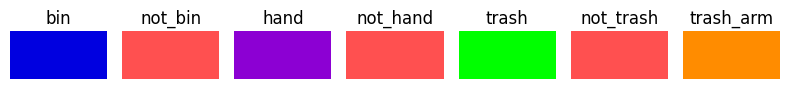

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Normalize RGB values to 0-1 range
def normalize_rgb(rgb_tuple):
  return tuple(x/255 for x in rgb_tuple)

# Turn colors into normalized values
colors_and_labels_rgb = [(key, normalize_rgb(value)) for key, value in color_palette.items()]

# Plot squares
fix, ax = plt.subplots(1, 7, figsize=(8, 1))
ax = ax.flatten()
for idx, (label, color) in enumerate(colors_and_labels_rgb):
  ax[idx].add_patch(plt.Rectangle(xy=(0, 0), width=1, height=1, color=color))
  ax[idx].set_title(label)
  ax[idx].set_xlim(0,1)
  ax[idx].set_ylim(0,1)
  ax[idx].axis("off")

plt.tight_layout()
plt.show()

## Plot a single image and visualize the boxes

Let's do some visualizations to understand better our dataset and our bounding boxes.


### Create a function to help visualization

To save some space in our notebook (because probably too many images will increase the size of it), we are going to create two small helper functions:
1. `half_image` - halves the size of a give image
2. `half_boxes` - divides the input coordinates of a given input box by 2

In [ ]:
import PIL

def half_image(image: PIL.Image) -> PIL.Image:
  """ Resizes a given input image by half and returns the smaller version."""
  return image.resize(size=(image.size[0] //2, image.size[1]//2))

def half_boxes(boxes):
  """
  Halves an array/tensor of input boxes and returns them. Necessary for plotting them on a half sized image.
  """
  if isinstance(boxes, list):
    # if boxes are a list of list, then we have multiple boxes
    for box in boxes:
      if isinstance(box, list):
        return [[coordinate //2 for coordinate in box] for box in boxes]
      else:
        return [coordinate //2 for coordinate in boxes]

  if isinstance(boxes, np.ndarray):
    return(boxes //2)

  if isinstance(boxes, torch.Tensor):
    return(boxes //2)


In [ ]:
# Test the functions
image_test = dataset["train"][42]["image"]
image_test_half = half_image(image= image_test)
print(f'[INFO] Original image size: {image_test.size} | Half image size: {image_test_half.size}')

# Create examples to tests the function
boxes_test_list  =[100, 100, 100,100]
print(f"[INFO] Original boxes: {boxes_test_list} | Half boxes: {half_boxes(boxes_test_list)}")

boxes_test_torch = torch.tensor([100.0, 100.0, 100.0, 100.0])
print(f"[INFO] Original boxes: {boxes_test_torch} | Half boxes: {half_boxes(boxes_test_torch)}")

[INFO] Original image size: (960, 1280) | Half image size: (480, 640)
[INFO] Original boxes: [100, 100, 100, 100] | Half boxes: [50, 50, 50, 50]
[INFO] Original boxes: tensor([100., 100., 100., 100.]) | Half boxes: tensor([50., 50., 50., 50.])


### Plotting boxes on a single image step by step

To plot the image and its associated boxes, we are going to do the following steps:
1. select a random image from the dataset

2. Get the `image` (in our case is in `PIL` format) and the `bbox` from the random sample.
  * Optional: half the image and boxes with our functions

3. Turn the box coordinates into a `torch.tensor` (because we are going to use `torchvision`)

4. convert boxes from `XYWH` to `XYXY` (we are going to use `torchvision.ops.box_convert`). We do this because torchvision uses `XYXY`

5. get label names of target boxes and colors to match (from the `color_palette`)

6. draw the boxes on the image by:
  * turn the image into a tensor `torchvision.transforms.functional.pil_to_tensor`
  * draw the bounding boxes on our image tensors with: `torchvision.utils.draw_bounding_boxes`
  * turn the image and bouding box tensors back into a `PIL` image with: `torchvision.transforms.functional.to_pil_image`

[INFO] Showing training sample from index: 1022
Boxes in XYWY format: tensor([[  6., 427.,  60., 149.],
        [169., 352., 152., 121.],
        [155., 159., 268., 325.],
        [266., 326., 208., 179.]])
Boxes XYXY: tensor([[  6., 427.,  66., 576.],
        [169., 352., 321., 473.],
        [155., 159., 423., 484.],
        [266., 326., 474., 505.]])
Label names: ['not_trash', 'trash', 'bin', 'hand']
Color codes: [(255, 80, 80), (0, 255, 0), (0, 0, 224), (140, 0, 211)]


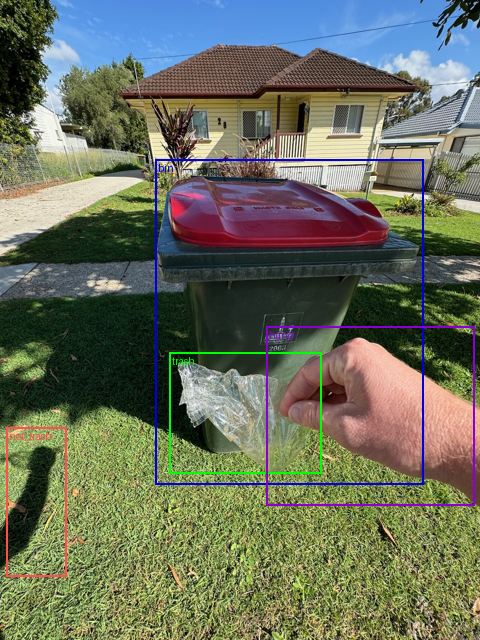

In [ ]:
# Plotting a bounding box on a single image
import random
import torch

from torchvision.ops import box_convert
from torchvision.utils import draw_bounding_boxes

from torchvision.transforms.functional import pil_to_tensor, to_pil_image

# 1. Select a random image from our dataset
random_index = random.randint(0, len(dataset["train"]))
print(f"[INFO] Showing training sample from index: {random_index}")
random_sample = dataset["train"][random_index]

# 2. Get the image and boxes from the random sample
random_sample_image = random_sample["image"]
random_sample_boxes = random_sample["annotations"]["bbox"]

# Optional: half image and boxes
half_random_sample_image = half_image(image = random_sample_image)
half_random_sample_boxes = half_boxes(boxes = random_sample_boxes)

# 3. Turn coordinates into a torch.tensor
boxes_xywh = torch.tensor(half_random_sample_boxes)
print(f"Boxes in XYWY format: {boxes_xywh}")

# 4. Convert boxes from XYWY -> XYXY
boxes_xyxy = box_convert(boxes = boxes_xywh,
                         in_fmt="xywh",
                         out_fmt="xyxy")
print(f"Boxes XYXY: {boxes_xyxy}")

# 5. Get label names of target boxes and colors to match
random_sample_label_names = [categories.feature.int2str(x) for x in random_sample["annotations"]["category_id"]]
random_sample_colors = [color_palette[label_name] for label_name in random_sample_label_names]
print(f"Label names: {random_sample_label_names}")
print(f"Color codes: {random_sample_colors}")

# 6. Draw the boxes on the image as tensors and then turn them into a PIL Image
to_pil_image(
    pic = draw_bounding_boxes(
        image = pil_to_tensor(pic=half_random_sample_image),
        boxes = boxes_xyxy,
        colors = random_sample_colors,
        labels = random_sample_label_names,
        width = 2,
        label_colors = random_sample_colors
    )
)

## Getting an object detection model

### Downloading our model from Hugging Face

For our project we are going to use the pretrained model called RT-DETRv2.

We can load our model with `transformers.AutoModelForObjectDetection.from_pretrained` and passing in the following parameters:
* pretrained_model_name_or_path - this is our target model, in our case `PekingU/rtdetr_v2_r50vd`
* `label2id`
* `id2label`
* `ignore_mismatched_sizes = True` - set this to True so our model can be instatiaed with a varying number of classes compared to what it may have been trained on

In [ ]:
from transformers import AutoModelForObjectDetection

MODEL_NAME = "PekingU/rtdetr_v2_r50vd"

model = AutoModelForObjectDetection.from_pretrained(
    pretrained_model_name_or_path = MODEL_NAME,
    label2id = label2id,
    id2label = id2label,
    ignore_mismatched_sizes = True
)

#model

config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/172M [00:00<?, ?B/s]

Some weights of RTDetrV2ForObjectDetection were not initialized from the model checkpoint at PekingU/rtdetr_v2_r50vd and are newly initialized because the shapes did not match:
- model.decoder.class_embed.0.bias: found shape torch.Size([80]) in the checkpoint and torch.Size([7]) in the model instantiated
- model.decoder.class_embed.0.weight: found shape torch.Size([80, 256]) in the checkpoint and torch.Size([7, 256]) in the model instantiated
- model.decoder.class_embed.1.bias: found shape torch.Size([80]) in the checkpoint and torch.Size([7]) in the model instantiated
- model.decoder.class_embed.1.weight: found shape torch.Size([80, 256]) in the checkpoint and torch.Size([7, 256]) in the model instantiated
- model.decoder.class_embed.2.bias: found shape torch.Size([80]) in the checkpoint and torch.Size([7]) in the model instantiated
- model.decoder.class_embed.2.weight: found shape torch.Size([80, 256]) in the checkpoint and torch.Size([7, 256]) in the model instantiated
- model.decod

We get a warning saying that the model needs to be trained and some shapes didn't match.

This is because our model has a different number of target classes (7 in total) compared to the original model (91 in total from the COCO dataset).

In order to get this model to work in our dataset, we need to fine-tune it.

### Inspect our model's layers

In [ ]:
#print(model)

In [ ]:
print(f"[INFO] Final classification layer: {model.class_embed}\n")
print(f"[INFO] Final box regression layer: {model.bbox_embed}")

[INFO] Final classification layer: ModuleList(
  (0-5): 6 x Linear(in_features=256, out_features=7, bias=True)
)

[INFO] Final box regression layer: ModuleList(
  (0-5): 6 x RTDetrV2MLPPredictionHead(
    (layers): ModuleList(
      (0-1): 2 x Linear(in_features=256, out_features=256, bias=True)
      (2): Linear(in_features=256, out_features=4, bias=True)
    )
  )
)


One important thing we can see here (in the last two layers of the model):
1. `class_embed` = classification head with `out_features = 7` (one for each of our labels: `'bin', 'hand', 'not_bin', 'not_hand', 'not_trash', 'trash', 'trash_arm'`)
2. `bbox_embed` = regression head with `out_features=4` (one for each of our bbox coordinates: e.g.`[center_x, center_y, width, height]`)

The two layers are what are going to output the final predictions of our model in structure similar to our annotations.

The `class_embed` will output the predicted class label of a given bounding box output from `bbox_predictor`

### Creating a function to build our model

In [ ]:
from transformers import AutoModelForObjectDetection

MODEL_NAME = "PekingU/rtdetr_v2_r50vd"

# Set up the model
def create_model(pretrained_model_name_or_path: str = MODEL_NAME,
                 label2id: dict = label2id,
                 id2label: dict = id2label):
  """
  Creates and return and instances of AutoModelForObjectDetection.

  Arg:
    pretrained_model_name_or_path (str): the name or path of the pretrained model to load.
    label2id(dict): a dictionary mapping class labels to IDs. Defaults label2id
    id2label(dict): a dictionary mapping class IDs to labels. Defaults id2labels

  Returns:
    AutoModelForObjectDetection: a pretrained model for object detection with number of output class
    equivalent to len(label2id)
  """

  model = AutoModelForObjectDetection.from_pretrained(
      pretrained_model_name_or_path = pretrained_model_name_or_path,
      label2id = label2id,
      id2label = id2label,
      ignore_mismatched_sizes = True #default
  )
  return model

In [ ]:
# Create a new model instance
model = create_model()
#model

Some weights of RTDetrV2ForObjectDetection were not initialized from the model checkpoint at PekingU/rtdetr_v2_r50vd and are newly initialized because the shapes did not match:
- model.decoder.class_embed.0.bias: found shape torch.Size([80]) in the checkpoint and torch.Size([7]) in the model instantiated
- model.decoder.class_embed.0.weight: found shape torch.Size([80, 256]) in the checkpoint and torch.Size([7, 256]) in the model instantiated
- model.decoder.class_embed.1.bias: found shape torch.Size([80]) in the checkpoint and torch.Size([7]) in the model instantiated
- model.decoder.class_embed.1.weight: found shape torch.Size([80, 256]) in the checkpoint and torch.Size([7, 256]) in the model instantiated
- model.decoder.class_embed.2.bias: found shape torch.Size([80]) in the checkpoint and torch.Size([7]) in the model instantiated
- model.decoder.class_embed.2.weight: found shape torch.Size([80, 256]) in the checkpoint and torch.Size([7, 256]) in the model instantiated
- model.decod

### Trying to pass a single sample through our model (part1)

Let's see what happens if we try to pass a sample to our model.

>*Note:* It’s good practice to try and pass a single sample through your model as soon as possible to see what happens.

>If we’re lucky, it’ll work.

>If we’re really lucky, we’ll get an error message saying why it didn’t work (this is usually the case because rarely does raw data flow through a model without being preprocessed first).

In [ ]:
# # Do a single forward pass with the model
# random_sample_outputs = model(pixel_values = random_sample["image"],
#                               pixel_mask = None)
# random_sample_outputs

We see an error why?

Because we are trying to pass a `PIL.Image` to our model insteand of `tensor.FloatTensor` of shape `(batch_size, num_channels, height, width)`.

It seems we need to do some changes to our data before passing it to our model.

## Loading our model's processor

We need yo prepare our input images for the model. And to do so, we are going to use `transformers.AutoImageProcessor`.

In [ ]:
from transformers import AutoImageProcessor

MODEL_NAME = "PekingU/rtdetr_v2_r50vd"

# Load the image processor
image_processor = AutoImageProcessor.from_pretrained(pretrained_model_name_or_path = MODEL_NAME,
                                                     use_fast = True)
image_processor

preprocessor_config.json:   0%|          | 0.00/444 [00:00<?, ?B/s]

RTDetrImageProcessorFast {
  "crop_size": null,
  "data_format": "channels_first",
  "default_to_square": false,
  "device": null,
  "disable_grouping": null,
  "do_center_crop": null,
  "do_convert_annotations": true,
  "do_convert_rgb": null,
  "do_normalize": false,
  "do_pad": false,
  "do_rescale": true,
  "do_resize": true,
  "format": "coco_detection",
  "image_mean": [
    0.485,
    0.456,
    0.406
  ],
  "image_processor_type": "RTDetrImageProcessorFast",
  "image_std": [
    0.229,
    0.224,
    0.225
  ],
  "input_data_format": null,
  "pad_size": null,
  "resample": 2,
  "rescale_factor": 0.00392156862745098,
  "return_segmentation_masks": null,
  "return_tensors": null,
  "size": {
    "height": 640,
    "width": 640
  }
}

This gives us some parameters that we need to adjust in our images before we pass them to our model.

* the `image_processor` is expecting our bounding boxes to be in `COCO format`(see the `"format": coco_detection` field)
* the `size`the model needs is:
```
"size":{
  "height": 640,
  "width" : 640
}
```

We are going to update our `image_processor` with a few custom parameters:
* `do_convert_annotations = True`: this wil convert our boxes to the format `CXCYWH` that is the format the model needs.
* `size`: our images will have the format `"longest_edge": 640` and `"shortest_edge": 640`
* `do_pad = True`: images in the same batch hve the same dimensions.

**IMPORTANT**

`format = "coco_detection"` doesn't mean "Convert my annotations into COCO format" it means "Expect the annotations I pass you to already be in COCO format"  

SO OUR ANNOTATIONS ARE NOT IN COCO FORMAT YET!

In [ ]:
# Set image size
IMAGE_SIZE = 640

# Create a new instance of the image processor with the different parameters
image_processor = AutoImageProcessor.from_pretrained(
    pretrained_model_name_or_path = MODEL_NAME,
    use_fast = True,
    format = "coco_detection",
    do_convert_annotations = True,
    size = {
        "shortest_edge": IMAGE_SIZE,
        "longest_edge": IMAGE_SIZE
    },
    return_segmentation_masks = True,
    do_pad = True
)

image_processor

RTDetrImageProcessorFast {
  "crop_size": null,
  "data_format": "channels_first",
  "default_to_square": false,
  "device": null,
  "disable_grouping": null,
  "do_center_crop": null,
  "do_convert_annotations": true,
  "do_convert_rgb": null,
  "do_normalize": false,
  "do_pad": true,
  "do_rescale": true,
  "do_resize": true,
  "format": "coco_detection",
  "image_mean": [
    0.485,
    0.456,
    0.406
  ],
  "image_processor_type": "RTDetrImageProcessorFast",
  "image_std": [
    0.229,
    0.224,
    0.225
  ],
  "input_data_format": null,
  "pad_size": null,
  "resample": 2,
  "rescale_factor": 0.00392156862745098,
  "return_segmentation_masks": true,
  "return_tensors": null,
  "size": {
    "longest_edge": 640,
    "shortest_edge": 640
  }
}

In [ ]:
# # Try to process a single image
# random_sample_preprocessed = image_processor.preprocess(images=random_sample["image"],
#                                                         annotations = random_sample["annotations"])


This doesn't work because the sample is not in COCO format and is missing the expected structure.

The `annotations` are not in the COCO format.

### Preprocessing a single image

It turns out our annotations aren't in the format our `preprocess` method expect.

We need to transform our data to the COCO format.

In [ ]:
# Preprocess our target sample
random_sample_preprocessed_image_only = image_processor(images = random_sample["image"],
                                                        annotations = None,
                                                        mask_path = None,
                                                        return_tensors = "pt")
print(random_sample_preprocessed_image_only.keys())

Unused or unrecognized kwargs: mask_path.


KeysView({'pixel_mask': tensor([[[1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         ...,
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1]]]), 'pixel_values': tensor([[[[0.2235, 0.2941, 0.3686,  ..., 0.1216, 0.0824, 0.0745],
          [0.1922, 0.2471, 0.4863,  ..., 0.1882, 0.2000, 0.0627],
          [0.3412, 0.3490, 0.2863,  ..., 0.4000, 0.2157, 0.0275],
          ...,
          [0.0745, 0.1137, 0.1765,  ..., 0.5608, 0.6392, 0.4863],
          [0.0471, 0.0824, 0.1412,  ..., 0.4706, 0.5882, 0.7020],
          [0.0706, 0.0784, 0.1412,  ..., 0.4863, 0.4627, 0.6471]],

         [[0.2510, 0.3294, 0.4039,  ..., 0.1294, 0.0784, 0.0745],
          [0.2275, 0.2863, 0.5216,  ..., 0.2000, 0.2000, 0.0667],
          [0.3882, 0.3922, 0.3294,  ..., 0.4314, 0.2275, 0.0471],
          ...,
          [0.0980, 0.1373, 0.1961,  ..., 0.5020, 0.5804, 0.4353],
          [0.0706, 0.1059, 0.1686,  ..., 

What we get is:
* `pixel_values` - the processed pixel values of the input image
* `pixel_mask` - a mask multiplier for the pixel values as to whether they should be paid attention to or not (a value of `0` means the pixel value should be ignored by the model and a value of `1` means the pixel value should be paid attention to by the model).

In [ ]:
print(f"[INFO] Original image shape: {random_sample['image'].size} -> [width, height]")
print(f"[INFO] Preprocessed image shape: {random_sample_preprocessed_image_only['pixel_values'].shape} -> [batch_size, colour_channles, height, width]")

[INFO] Original image shape: (960, 1280) -> [width, height]
[INFO] Preprocessed image shape: torch.Size([1, 3, 640, 480]) -> [batch_size, colour_channles, height, width]


### Trying to pass a single sample through our model (part 2)

In [ ]:
# Do a singe pass with the model
random_sample_outputs = model(
    pixel_values = random_sample_preprocessed_image_only["pixel_values"],
    pixel_mask = random_sample_preprocessed_image_only["pixel_mask"]
)

In [ ]:
random_sample_outputs.keys()

odict_keys(['logits', 'pred_boxes', 'last_hidden_state', 'intermediate_hidden_states', 'intermediate_logits', 'intermediate_reference_points', 'encoder_last_hidden_state', 'init_reference_points', 'enc_topk_logits', 'enc_topk_bboxes', 'enc_outputs_class', 'enc_outputs_coord_logits'])

What we have here:
* `logits` - the raw outputs from the model, these are the classification logits we can later apply a softmax/sigmoid function to get prediction probabilities
* `pred_boxes` - normalized box coordinates in `CXCYWH` format.

In [ ]:
# Inspect logits output shape
output_logits = random_sample_outputs.logits
print(f"[INFO] Output logits shape: {output_logits.shape} -> [1 image, 300 boxes, 7 classes]")

[INFO] Output logits shape: torch.Size([1, 300, 7]) -> [1 image, 300 boxes, 7 classes]


The final value of 7 in the `output_logits` tensor is equivalent to the number of classes we have.

And the `300` is the number of boxes our model predicts for each image

In [ ]:
# Inspect predicted boxes output shape
output_pred_boxes = random_sample_outputs.pred_boxes
print(f"[INFO] Output predicted boxes shape: {output_pred_boxes.shape} -> [1 image, 300 boxes, 4 coordinates (center_x, center_y, width, height)]")

[INFO] Output predicted boxes shape: torch.Size([1, 300, 4]) -> [1 image, 300 boxes, 4 coordinates (center_x, center_y, width, height)]


## Preprocessing our annotations

As we said before our annotations are not in the right format, they aren't in COCO format.

`"annotations"` needs to be a list of dictionaries like this:

```
[{
    "image_id": 42,
    "annotations": [{
        "id": 123456,
        "category_id": 1,
        "iscrowd": 0,
        "segmentation": [
            [42.0, 55.6, ... 99.3, 102.3]
        ],
        "image_id": 42, # this matches the 'image_id' field above
        "area": 135381.07,
        "bbox": [523.70,
                 545.09,
                 402.79,
                 336.11]
    },
    # Next annotation in the same format as the previous one (one annotation per dict).
    # For example, if an image had 4 bounding boxes, there would be a list of 4 dictionaries
    # each containing a single annotation.
    ...]
}]
```

Let's break down the fields in the COCO annotations:
* `image_id` (int, required): ID of the target image
* `annotations` (list[Dict]): list of dictionaries with one box annotations per dict.
  * `id` (int, not required): ID of the particular annotation
  * `category_id` (int, required): ID of the class the box relates to (e.g {0: "bin", 1: "hand"...}
  * `image_id` (int, required): ID of the target image the partiular box relates to, should match `image_id`
  * `area` (float, not required): area of the target bounding box
  * `bbox` (list[float], required): coordinates of the target bounding box in XYWH
  * `is_crowd` (int, not required): boolean flag (0 or 1) to indicate whether or not and object is multiple of the same thing.

### Creating dataclasses to represent the COCO bounding box format

We are going to create two Python dataclasses to house our desired COCO annotations format:

1. Create `SingleCocoAnnotation` which contains the format structure of a single COCO annotation
2. Create `ImageCOCOAnnotations` which contains all of the annotations for a given image in COCO format


In [ ]:
from dataclasses import dataclass, asdict
from typing import List, Tuple

# 1. Create a dataclass for a single COCO annotation
@dataclass
class SingleCOCOAnnotation:
  """An instance of a single COCO annotation.
    Represent a COCO-formatted (see: https://cocodataset.org/#format-data) single instance of an object
    in an image.

    Attributes:
        image_id: Unique integer identifier for the image which the annotation belongs to.
        category_id: Integer identifier for the target object label/category (e.g. "0" for "bin").
        bbox: List of floats containing target bounding box coordinates in absolute XYWH format ([x_top_left, y_top_left, width, height]).
        area: Area of the target bounding box. Defaults to 0.0.
        iscrowd: Boolean flag (0 or 1) indicating whether the target is a crowd of objects, for example, a group of
            apples rather than a single apple. Defaults to 0.
  """
  image_id: int
  category_id: int
  bbox: List[float]
  area: float = 0.0
  iscrow: int = 0

  # Make sure the bbox in always a list of 4 values (XYWH format)
  def __post_init__(self):
    if len(self.bbox) !=4:
      raise ValueError(f"bbox must contain exactly 4 values, current length: {len(self.bbox)}")


# 2. Create a dataclass for a collection of COCO for a single image
@dataclass
class ImageCOCOAnnotations:
  """ A collection of COCO annotations for a single image_id.

  Attributes:
    image_id: Unique integer identifier for the image which the annotations belong to.
    annotations: List of SingleCOCOAnnotation instances.
  """
  image_id: int
  annotations: List[SingleCOCOAnnotation]

In [ ]:
# Let's try our dataclasses
SingleCOCOAnnotation(image_id=42,
                     category_id = 0,
                     bbox=[100,100,100,100])

SingleCOCOAnnotation(image_id=42, category_id=0, bbox=[100, 100, 100, 100], area=0.0, iscrow=0)

### Creating a function to format our annotations as COCO

Now that we've got the COCO data format in our dataclasses, let's write a function (`format_image_annotations_as_coco`) to format our data in COCO style:
1. Take in an `image_id` to represent a unique identifier for the image as well a lists of category int, area values and bounding box coordinates in the **raw format our our data**
2. Convert that information into a COCO dictionary (`asdict`) with the dataclasses from before.
3. Return a dictionary of the data in COCO format.

In [ ]:
# 1. Take in a unique image_id as well a list of categories, areas and bounding boxes
def format_image_annotations_as_coco(
      image_id: int,
      categories: List[int],
      areas: List[float],
      bboxes: List[Tuple[float, float, float, float]] #in XYWH format
) -> dict:
      """Formats lists of image annotations into COCO format.

      Takes in parallel lists of categories, areas, and bounding boxes and
      then formats them into a COCO-style dictionary of annotations.

      Args:
          image_id: Unique integer identifier for an image.
          categories: List of integer category IDs for each annotation.
          areas: List of float areas for each annotation.
          bboxes: List of tuples containing bounding box coordinates in XYWH format
              ([x_top_left, y_top_left, width, height]).

      Returns:
          A dictionary of image annotations in COCO format with the following structure:
          {
              "image_id": int,
              "annotations": [
                  {
                      "image_id": int,
                      "category_id": int,
                      "bbox": List[float],
                      "area": float
                  },
                  ...more annotations here
              ]
          }

      Note:
          All input lists much be the same length and in the same order.
          Otherwise, there will be mismatched annotations.
      """
      # 2. Turn input list into a list of dicts
      coco_format_annotations = [
          asdict(SingleCOCOAnnotation(
              image_id = image_id,
              category_id= category,
              bbox = list(bbox),
              area = area
          ))
          for category, area, bbox in zip(categories, areas, bboxes)
      ]

      # 3. Return the dictionary
      return asdict(ImageCOCOAnnotations(image_id = image_id,
                                         annotations=coco_format_annotations))

Now let's try this function in a random sample

In [ ]:
# Create a "random" sample and inspect it
random_sample = dataset["train"][77]
random_sample

{'image': <PIL.Image.Image image mode=RGB size=960x1280>,
 'image_id': 558,
 'annotations': {'file_name': ['13df7e4a-1a5c-4da9-a5d3-204b6119670c.jpeg',
   '13df7e4a-1a5c-4da9-a5d3-204b6119670c.jpeg',
   '13df7e4a-1a5c-4da9-a5d3-204b6119670c.jpeg'],
  'image_id': [558, 558, 558],
  'category_id': [5, 0, 1],
  'bbox': [[261.8999938964844, 734.5, 181.8000030517578, 216.3000030517578],
   [99.80000305175781, 215.1999969482422, 730.0, 685.7999877929688],
   [0.0, 769.2999877929688, 367.8999938964844, 508.70001220703125]],
  'iscrowd': [0, 0, 0],
  'area': [39323.33984375, 500634.0, 187150.734375]},
 'label_source': 'manual_prodigy_label',
 'image_source': 'manual_taken_photo'}

In [ ]:
# Extract image_id, categories, areas, and bboxes from the random sample
random_sample_image_id = random_sample["image_id"]
random_sample_categories = random_sample["annotations"]["category_id"]
random_sample_areas = random_sample["annotations"]["area"]
random_sample_bboxes = random_sample["annotations"]["bbox"]

# Format the random sample annotations as COCO format
random_sample_coco_annotations = format_image_annotations_as_coco(image_id= random_sample_image_id,
                                                                  categories = random_sample_categories,
                                                                  areas = random_sample_areas,
                                                                  bboxes = random_sample_bboxes)
random_sample_coco_annotations

{'image_id': 558,
 'annotations': [{'image_id': 558,
   'category_id': 5,
   'bbox': [261.8999938964844, 734.5, 181.8000030517578, 216.3000030517578],
   'area': 39323.33984375,
   'iscrow': 0},
  {'image_id': 558,
   'category_id': 0,
   'bbox': [99.80000305175781, 215.1999969482422, 730.0, 685.7999877929688],
   'area': 500634.0,
   'iscrow': 0},
  {'image_id': 558,
   'category_id': 1,
   'bbox': [0.0, 769.2999877929688, 367.8999938964844, 508.70001220703125],
   'area': 187150.734375,
   'iscrow': 0}]}

Now our annotations are in the right COCO format with `image_id` and `annotations` keys.

### Preprocess a single image and set of COCO format annotations

Now let's try this with an image

In [ ]:
# Preprocess random sample image and associated annotations
random_sample_preprocessed = image_processor.preprocess(images=random_sample["image"],
                                                        annotations = random_sample_coco_annotations,
                                                        do_convert_annotations = True, # default to True, convert annotations to normalized CXCYWH
                                                        return_tensors = "pt") # returns a PyTorch tensor


In [ ]:
# check the keys of our preprocessed example
random_sample_preprocessed.keys()

KeysView({'pixel_mask': tensor([[[1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         ...,
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1]]]), 'pixel_values': tensor([[[[0.4980, 0.4314, 0.5333,  ..., 0.3020, 0.2902, 0.2941],
          [0.5843, 0.4510, 0.4392,  ..., 0.2863, 0.2745, 0.2784],
          [0.7020, 0.5686, 0.4471,  ..., 0.2588, 0.2588, 0.2627],
          ...,
          [0.2588, 0.2627, 0.2588,  ..., 0.5412, 0.6510, 0.6275],
          [0.2706, 0.2706, 0.2667,  ..., 0.6235, 0.6235, 0.5882],
          [0.2784, 0.2784, 0.2745,  ..., 0.7020, 0.6745, 0.5804]],

         [[0.4510, 0.3843, 0.4941,  ..., 0.2863, 0.2745, 0.2784],
          [0.5451, 0.4118, 0.4000,  ..., 0.2706, 0.2588, 0.2627],
          [0.6706, 0.5373, 0.4157,  ..., 0.2431, 0.2431, 0.2471],
          ...,
          [0.2431, 0.2471, 0.2431,  ..., 0.5098, 0.6196, 0.5961],
          [0.2549, 0.2549, 0.2510,  ..., 

We get a prepreocessed image and labels:
* `pixel_values` = prerocessed pixels (the preprocessed image)
* `labels` = preprocessed labels (the preprocessed annotations)

In [ ]:
# Inspect preprocessed image shape
print(f"[INFO] Preprocessed image shape: {random_sample_preprocessed['pixel_values'].shape} -> [batch_size, colour_channels, height, width]")

[INFO] Preprocessed image shape: torch.Size([1, 3, 640, 480]) -> [batch_size, colour_channels, height, width]


We get a batch = 1 because we have only passed a single sample

In [ ]:
from pprint import  pprint
# Inspect the preprocessed labels (our boxes and other metadata)
pprint(random_sample_preprocessed["labels"])

[{'area': tensor([  9830.8350, 125158.5000,  46787.6836]),
  'boxes': tensor([[0.3675, 0.6583, 0.1894, 0.1690],
        [0.4842, 0.4360, 0.7604, 0.5358],
        [0.1916, 0.7997, 0.3832, 0.3974]]),
  'class_labels': tensor([5, 0, 1]),
  'image_id': tensor([558]),
  'iscrowd': tensor([0, 0, 0]),
  'orig_size': tensor([1280,  960]),
  'size': tensor([640, 480])}]


Let's break this down:
* `area` - an array/tensor of floats containing the are (`box_width * box_height`) of our boxes.
* `boxes` - an array/tensor containing all of the bounding boxes for our image in normalized `CXCYWH`
* `class_labels` - an array/tensor of integer labels associated with each box
* `image_id` - a unique int identifier for our target image
* `is_crowd` - an array/tensor of a boolean value (0 or 1) for whether an annotation is a group or not
* `orig_size` - an array/tensor containing the original size in (`height, width`) format
* `size` - an array/tensor with the current size in (`height, width`) format on the processed image tensor

## Postprocessing a single sample

Tip: it's always a good idea to try and to go end to end on a single sample. For example take a raw sample (our data), preprocess it, pass it through the model, then post process it.

The function we'll use to post-process our model's output is `post_process_object_detection()`

In [ ]:
# Recompute the random sample outputs with our preprocessed sample
random_sample_outputs = model(
    pixel_values = random_sample_preprocessed["pixel_values"],
    pixel_mask = random_sample_preprocessed["pixel_mask"] #optional, some models expect it
)

# Inspect the output type
type(random_sample_outputs)

transformers.models.rt_detr_v2.modeling_rt_detr_v2.RTDetrV2ObjectDetectionOutput

Now we can use the following parameters for our method:
* `outputs` - raw outputs of the model (in this case `random_sample_outputs`)
* `threshold` - a float score value to keep or discard boxes. A lower value means more boxes will be kept, however, these may be over lower quality.
* `target_sizes` - size of target image in (`height, width`) format for bounding boxes. The number of `target_sizes` must match number of `outputs`.
* `top_k` - int defining the number of boxes you'd like to prepared for postprocessing before thresholding.

In [ ]:
# Set the score threshold
THRESHOLD = 0.4

# Post process a single output from our model
random_sample_outputs_postprocessed = image_processor.post_process_object_detection(
    outputs = random_sample_outputs,
    threshold = THRESHOLD,
    target_sizes = random_sample_preprocessed["labels"][0]["orig_size"].unsqueeze(0)
    # original input image size (or whichever target size you'd like), required to be same number of input items in a list
)
random_sample_outputs_postprocessed

[{'scores': tensor([0.5899, 0.5562, 0.5290, 0.5284, 0.5186, 0.5178, 0.4958, 0.4699, 0.4666,
          0.4589, 0.4574, 0.4556, 0.4551, 0.4546, 0.4538, 0.4442, 0.4429, 0.4420,
          0.4364, 0.4358, 0.4348, 0.4344, 0.4339, 0.4322, 0.4322, 0.4316, 0.4315,
          0.4301, 0.4297, 0.4268, 0.4262, 0.4258, 0.4254, 0.4227, 0.4225, 0.4224,
          0.4208, 0.4202, 0.4144, 0.4122, 0.4114, 0.4107, 0.4105, 0.4104, 0.4096,
          0.4094, 0.4086, 0.4073, 0.4070, 0.4068, 0.4068, 0.4065, 0.4062, 0.4055,
          0.4047, 0.4021, 0.4013, 0.4010, 0.4009, 0.4005],
         grad_fn=<IndexBackward0>),
  'labels': tensor([5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 5, 5, 5, 5,
          6, 5, 5, 6, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6,
          5, 6, 5, 5, 5, 5, 5, 5, 5, 5, 6, 5]),
  'boxes': tensor([[ 121.5742,  378.2336,  794.8571,  889.9295],
          [ 113.5849,  222.1163,  820.0316, 1228.9485],
          [ 215.3474,  237.2395,  814.3347,  897.9744],
    

What we get from here:
* `scores` - the prediction probabilites for each box, higher means the model is more confident in this prediction.
* `labels`- the predictied classification label values for each box (label IDs)
* `boxes` - the predicted bounding boxes whose scores are above the `threshold` parameter. These are in `absolute XYXY` format.

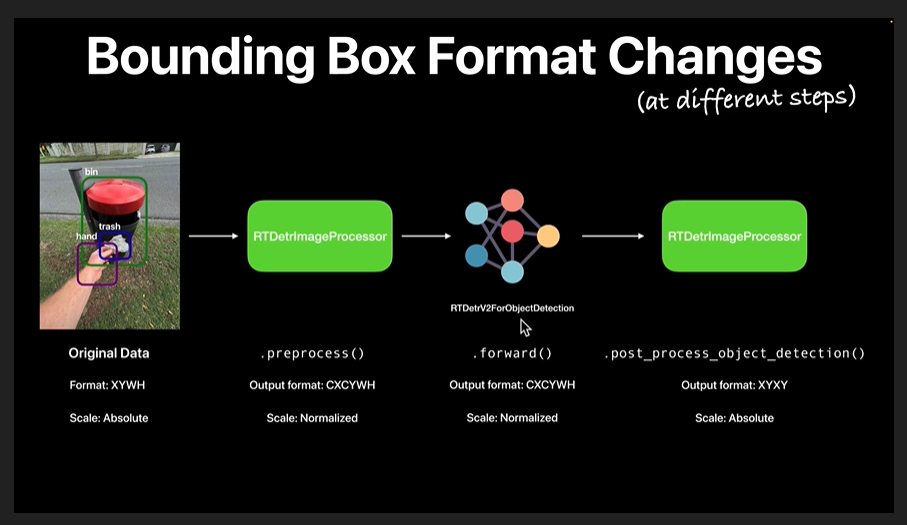

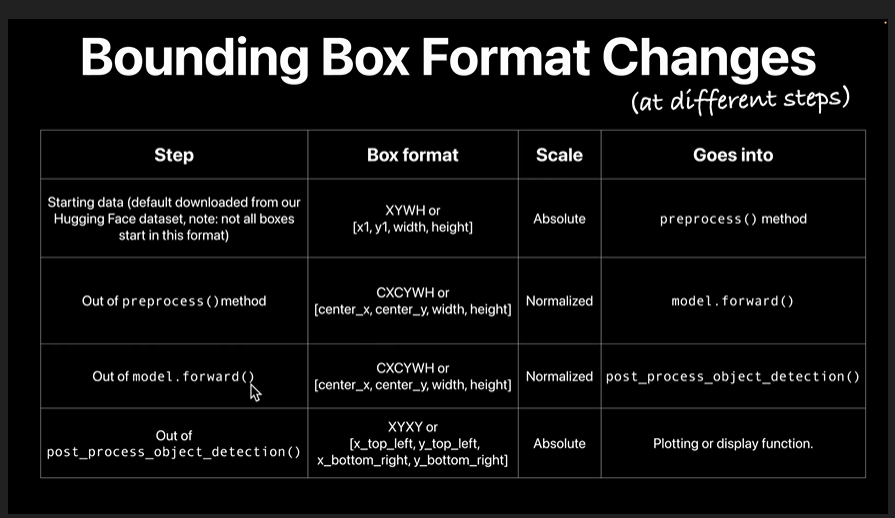

### Plotting our model's post processed predictions on our image

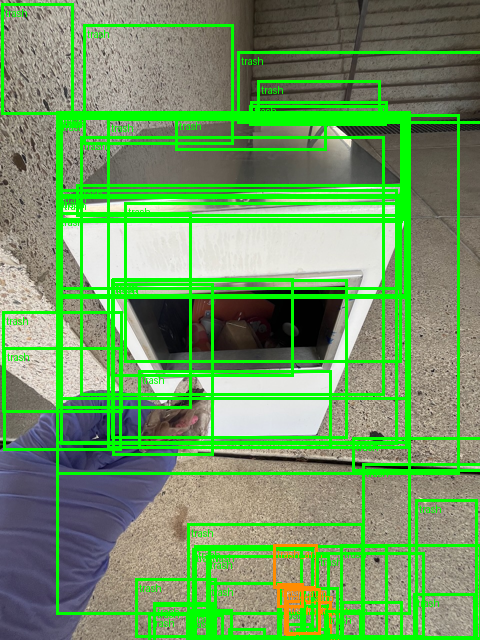

In [ ]:
# Get target image and boxes
image_to_plot = half_image(random_sample["image"])
boxes_to_plot = half_boxes(random_sample_outputs_postprocessed[0]["boxes"])

# Collect the boxes scores and labels
random_sample_label_names = []
for result in random_sample_outputs_postprocessed:
  for score, label_id, box in zip(result["scores"],
                                  result["labels"],
                                  result["boxes"]):
    score, label = score.item(), label_id.item()
    box = [round(i, 2) for i in box.tolist()]
    random_sample_label_names.append(model.config.id2label[label])

# Get the list of colors to plot
random_sample_colors = [color_palette[label_name] for label_name in random_sample_label_names]
#print(f"Label names: {random_sample_label_names}")
#print(f"Color codes: {random_sample_colors}")

# Create the output image with plotted boxes
output_image_with_boxes = to_pil_image(
    pic = draw_bounding_boxes(
        image = pil_to_tensor(pic=image_to_plot),
        boxes = boxes_to_plot,
        labels = random_sample_label_names,
        colors = random_sample_colors,
        width = 3,
        label_colors = random_sample_colors
    )
)

output_image_with_boxes

## Preparing data at scale

We did the pre and post processing steps on a single data sample but we need to make it work for more samples.

1. Splitting the data into trainining, validation and test sets.
2. Preprocessing multiple samples at a time by iterating over groups of samples.
3. Collate samples into batches so our model can view multiple samples simultaneously. We will pass **batches** of data to the model.

### Splitting the data into training and test sets

We want our model to *hopefully* generalize to unseen training samples.

To evaluate our model's ability to perfom on unseen samples, we'll split our data into three sets:

1. Training set (~70-80% of your data) - This is like the course material in university preparing before the exam/real world
2. Validation set (~5-20% of data)- this is like the practice exam in university before the real test, we can adjust our model's settings/hyparameters on the results we see here.
3. Test set (~5-20% of your data) - this is like the final exam in a university course/the first problems your model will see in the real world.

In [ ]:
# Original dataset (only a "train" split)
dataset = load_dataset(path="mrdbourke/trashify_manual_labelled_images")
original_dataset_length = len(dataset["train"])
dataset

DatasetDict({
    train: Dataset({
        features: ['image', 'image_id', 'annotations', 'label_source', 'image_source'],
        num_rows: 1128
    })
})

In [ ]:
print(f"[INFO] Right now we have {original_dataset_length} training samples")

[INFO] Right now we have 1128 training samples


In [ ]:
# 1. Split the data into "train" and "test" splits
dataset_split = dataset["train"].train_test_split(test_size = 0.3, seed=42)

# 2.Split the test split into "test" and "validation" splits
dataset_test_val_split = dataset_split["test"].train_test_split(test_size=0.66, seed=42)

# Create "train" split from 1
dataset["train"] = dataset_split["train"]

# Create a "validation" and "test" split from 2
dataset["validation"] = dataset_test_val_split["train"]
dataset["test"] = dataset_test_val_split["test"]

# Ensure splits lengths add to equal original dataset
assert original_dataset_length == len(dataset["train"]) + len(dataset["validation"]) + len(dataset["test"]),"Total dataset split lengths don't equal original dataset length, is there a mismatch? Perhaps try reloading the original dataset and re-running this cell."

# View the dataset
dataset

DatasetDict({
    train: Dataset({
        features: ['image', 'image_id', 'annotations', 'label_source', 'image_source'],
        num_rows: 789
    })
    validation: Dataset({
        features: ['image', 'image_id', 'annotations', 'label_source', 'image_source'],
        num_rows: 115
    })
    test: Dataset({
        features: ['image', 'image_id', 'annotations', 'label_source', 'image_source'],
        num_rows: 224
    })
})

### Writting a function for preprocessing multiple samples at a time

In [ ]:
# Remind ourselves what a single unprocessed sample looks like
one_sample = dataset["train"][42]
one_sample

{'image': <PIL.Image.Image image mode=RGB size=960x1280>,
 'image_id': 663,
 'annotations': {'file_name': ['1d2ea64a-0296-403d-93cd-31e3f116c995.jpeg',
   '1d2ea64a-0296-403d-93cd-31e3f116c995.jpeg'],
  'image_id': [663, 663],
  'category_id': [1, 5],
  'bbox': [[413.29998779296875,
    529.7000122070312,
    343.6000061035156,
    687.0999755859375],
   [435.8999938964844, 463.0, 77.19999694824219, 99.9000015258789]],
  'iscrowd': [0, 0],
  'area': [236087.5625, 7712.27978515625]},
 'label_source': 'manual_prodigy_label',
 'image_source': 'manual_taken_photo'}

In [ ]:
# Get three samples from the training set
group_of_samples = dataset["train"][0:3]
group_of_samples

{'image': [<PIL.Image.Image image mode=RGB size=960x1280>,
  <PIL.Image.Image image mode=RGB size=960x1280>,
  <PIL.Image.Image image mode=RGB size=960x1280>],
 'image_id': [69, 1027, 1092],
 'annotations': [{'file_name': ['c56fee61-959c-44b8-ada2-807d2ff45f90.jpeg',
    'c56fee61-959c-44b8-ada2-807d2ff45f90.jpeg',
    'c56fee61-959c-44b8-ada2-807d2ff45f90.jpeg',
    'c56fee61-959c-44b8-ada2-807d2ff45f90.jpeg',
    'c56fee61-959c-44b8-ada2-807d2ff45f90.jpeg',
    'c56fee61-959c-44b8-ada2-807d2ff45f90.jpeg',
    'c56fee61-959c-44b8-ada2-807d2ff45f90.jpeg',
    'c56fee61-959c-44b8-ada2-807d2ff45f90.jpeg'],
   'image_id': [69, 69, 69, 69, 69, 69, 69, 69],
   'category_id': [5, 0, 1, 4, 4, 4, 4, 4],
   'bbox': [[360.20001220703125, 528.5, 177.1999969482422, 261.79998779296875],
    [298.29998779296875,
     495.1000061035156,
     381.1000061035156,
     505.70001220703125],
    [81.5999984741211,
     592.0999755859375,
     358.79998779296875,
     316.29998779296875],
    [1.29999995231

> **Note:** Our data is in this structure (a dictionary of list, rather than a list of dictionaries) because it is built on HF Datasets and it is built on Apache Arrow.

> So instead of our dataset being represented as many rows (list of dictionaries), it is represented as many columns (dictionary of list)

We need our function to turn of given samples from our dataset into the format our `preprocess` method wants.

For this we are going to create a function called `preprocess_batch` which will take a list of our raw examples and format them into a list of images and COCO formatted annotations.

To do so we'll:
1. Take in a list of examples (these will be in the raw data format, our original data format), and `image_processor` instance and an optional `transforms` (we can use these transforms for data augmentation)
2. Create empyt list of `image` and `coco_annotations`
3. Extract the `image`, `image_id` and `annotations_dict` from our list of input examples
4. Create list of annotations attributes such as `bbox`, `category_id` and `area` (these are required for our `format_image_annotations_as_coco` function).
5. Optionally perform transforms/augmentations on the image an related boxes
6. Convert the annotations into COCO format using `format_image_annotations_as_coco`
7. Append the images and COCO formatted annotations to the empty lists created in step 2
8. Pass the list of images and COCO formatted annotations to the `image_processor.preprocess`
9. Return the preprocessed batch

In [ ]:
# 1.Take a list of examples, image processor and optional transform
def preprocess_batch(examples, image_processor, transforms = None):
  """
  Preprocess a batch of image data with annotations for object detection models.

  This function takes a batch of examples in a custom dataset format, extract images and
  their corresponding annotations, and converts them into a format suitable for model training
  or inference using the provided image processor.

  Args:
        examples (dict): A dictionary containing the batch data with the following structure:
            - "image" (List[PIL.Image.Image]): List of PIL Image objects
            - "image_id" (List[int]): List of unique image identifiers
            - "annotations" (List[dict]): List of annotation dictionaries, where each contains:
                - "file_name" (List[str]): List of image filenames
                - "image_id" (List[int]): List of image identifiers
                - "category_id" (List[int]): List of object category IDs
                - "bbox" (List[List[float]]): List of bounding boxes as [x, y, width, height]
                - "iscrowd" (List[int]): List of crowd indicators (0 or 1)
                - "area" (List[float]): List of object areas
            - "label_source" (List[str]): List of label sources
            - "image_source" (List[str]): List of image sources

        image_processor: An image processor object to preprocess images for model input.
            For example, can be `transformers.RTDetrDetrImageProcessor`.

        transforms (optional): Image and annotations transforms for data augmentation.
            Defaults to None.

    Returns:
        dict: Preprocessed batch with images and annotations converted to tensors
            in the format required for a `transformers.RTDetrV2ForObjectDetection` model.

    Note:
        The `format_image_annotations_as_coco` function converts the input annotation format to COCO
        format before applying the image_processor. This is required as the image_processor is designed
        to handle COCO format annotations.
  """

  # 2. Create empty list to store image and annotations
  images = []
  coco_annotations = []

  # 3. Extract the image, image_id and annotations from the examples
  for image, image_id, annotations_dict in zip (examples["image"],
                                                examples["image_id"],
                                                examples["annotations"]):
    # 4. Create list of annotations attributes
    bbox_list = annotations_dict["bbox"]
    category_list = annotations_dict["category_id"]
    area_list = annotations_dict["area"]

    # 5. Note: Could optionally apply a transform/augmentation here
    if transforms:
      pass

    # 6. Format the annotations into COCO format
    coco_format_annotations = format_image_annotations_as_coco(image_id = image_id,
                                                               categories = category_list,
                                                               areas = area_list,
                                                               bboxes = bbox_list)

    # 7. Add images/annotations to their respective list
    images.append(image)
    coco_annotations.append(coco_format_annotations)

  # 8. Apply the image processor to list of images and annotations
  preprocessed_batch = image_processor.preprocess(images = images,
                                                  annotations = coco_annotations,
                                                  return_tensors = "pt")
  # 9. Return the preprocessed batch
  return preprocessed_batch

In [ ]:
# Try our function
preprocessed_samples = preprocess_batch(examples = group_of_samples,
                                        image_processor = image_processor)
preprocessed_samples.keys()

KeysView({'pixel_mask': tensor([[[1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         ...,
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1]],

        [[1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         ...,
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1]],

        [[1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         ...,
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1]]]), 'pixel_values': tensor([[[[0.1216, 0.1216, 0.1176,  ..., 0.1961, 0.1961, 0.1922],
          [0.1216, 0.1216, 0.1216,  ..., 0.2706, 0.2745, 0.2745],
          [0.1176, 0.1216, 0.1216,  ..., 0.2980, 0.2941, 0.2980],
          ...,
          [0.1882, 0.1569, 0.3490,  ..., 0.3569, 0.4196, 0.3922],
  

In [ ]:
# Check the shape of our preprocessed samples
print(f"[INFO] Shape of preprocessed samples: {preprocessed_samples['pixel_values'].shape} -> [batch_size, colour_channels, height, width]")

[INFO] Shape of preprocessed samples: torch.Size([3, 3, 640, 480]) -> [batch_size, colour_channels, height, width]


### Applying our preprocessing function to each data split

To do so, we can call the `dataset.Dataset.with_transform()` method on our target dataset split and pass it our desired `transform`.

Because the `with_transform()` method expect a callable with a single argument, we'll turn our `preprocess_batch` into a *Python partial function*.

Doing this will mean we can prefill the `image_processor` and optionally the `transforms` parameter of our `preprocess_batch` function meaning it will only take `examples` as input.

**RESUME:** a partial function is a new function with all the common arguments pre-filled, so we only need to pass the one argument that changes.


In [ ]:
# Create a partial funtion for preprocessing
from functools import partial

preprocess_batch_partial = partial(preprocess_batch,
                                   image_processor = image_processor,
                                   transforms = None)
# Inspect the function
preprocess_batch_partial


functools.partial(<function preprocess_batch at 0x7ab9c3b37d80>, image_processor=RTDetrImageProcessorFast {
  "crop_size": null,
  "data_format": "channels_first",
  "default_to_square": false,
  "device": null,
  "disable_grouping": null,
  "do_center_crop": null,
  "do_convert_annotations": true,
  "do_convert_rgb": null,
  "do_normalize": false,
  "do_pad": true,
  "do_rescale": true,
  "do_resize": true,
  "format": "coco_detection",
  "image_mean": [
    0.485,
    0.456,
    0.406
  ],
  "image_processor_type": "RTDetrImageProcessorFast",
  "image_std": [
    0.229,
    0.224,
    0.225
  ],
  "input_data_format": null,
  "pad_size": null,
  "resample": 2,
  "rescale_factor": 0.00392156862745098,
  "return_segmentation_masks": true,
  "return_tensors": null,
  "size": {
    "longest_edge": 640,
    "shortest_edge": 640
  }
}
, transforms=None)

In [ ]:
# Create a copy of the original dataset
# (we do this so we can inspect the origianl dataset later on)
processed_dataset = dataset.copy()

# Apply the preprocessing function to the datasets
#(the preprocessing will happen on the fly, e.g. when the dataset is called rather than in-place)
processed_dataset["train"] = processed_dataset["train"].with_transform(preprocess_batch_partial)
processed_dataset["validation"] = processed_dataset["validation"].with_transform(preprocess_batch_partial)
processed_dataset["test"] = processed_dataset["test"].with_transform(preprocess_batch_partial)


In [ ]:
# Get an item fromt the dataset
processed_dataset["train"][42]

{'pixel_mask': tensor([[1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         ...,
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1]]),
 'pixel_values': tensor([[[0.0824, 0.2275, 0.2471,  ..., 0.3255, 0.3059, 0.3804],
          [0.2588, 0.1608, 0.2706,  ..., 0.4000, 0.4588, 0.4667],
          [0.2706, 0.2588, 0.2549,  ..., 0.7059, 0.5686, 0.4431],
          ...,
          [0.4941, 0.3137, 0.2235,  ..., 0.2745, 0.2314, 0.1647],
          [0.4824, 0.5490, 0.2392,  ..., 0.1725, 0.1451, 0.2157],
          [0.3176, 0.5294, 0.3137,  ..., 0.2039, 0.1059, 0.1490]],
 
         [[0.0941, 0.2392, 0.2549,  ..., 0.3176, 0.2941, 0.3765],
          [0.2706, 0.1686, 0.2784,  ..., 0.3922, 0.4471, 0.4588],
          [0.2784, 0.2667, 0.2588,  ..., 0.6980, 0.5569, 0.4353],
          ...,
          [0.4667, 0.2824, 0.1882,  ..., 0.2902, 0.2549, 0.2000],
          [0.4510, 0.5098, 0.2000,  ..., 0.1922, 0.

In [ ]:
# Compare it with the original data
dataset["train"][42]

{'image': <PIL.Image.Image image mode=RGB size=960x1280>,
 'image_id': 663,
 'annotations': {'file_name': ['1d2ea64a-0296-403d-93cd-31e3f116c995.jpeg',
   '1d2ea64a-0296-403d-93cd-31e3f116c995.jpeg'],
  'image_id': [663, 663],
  'category_id': [1, 5],
  'bbox': [[413.29998779296875,
    529.7000122070312,
    343.6000061035156,
    687.0999755859375],
   [435.8999938964844, 463.0, 77.19999694824219, 99.9000015258789]],
  'iscrowd': [0, 0],
  'area': [236087.5625, 7712.27978515625]},
 'label_source': 'manual_prodigy_label',
 'image_source': 'manual_taken_photo'}

### Creating a collation function

Now that we can preprocess multiple samples at once, we are going to create a collation function to tell our model trainer how to stack these samples together into batches.

So, so far we have:
  * Fuction to preprocesss our samples into COCO format(`format_image_annotations_as_coco()`) ✅ -> Apply that function to our dataset on the fly (`preprocess_batch()`) ✅ -> Tell our samples how to stack together in a batch.


> A collate funcion takjes several indivual samples from the dataset and combines them into ONE batch.

In [ ]:
from typing import List, Dict, Any

def data_collate_function(preprocessed_batch: List[Dict[str, Any]]) -> Dict[str, Any]:
  """
  Stacks together groups of preprocessed samples into batches for our model.

  Arg:
    preprocessed_batch: a list of dictionaries where each dictionary represents a preprocessed sample.

  Returns:
    collated_data: a dictionary containing the batches data ready in the format our model
    is expecting. The dictionary has the following keys:
      - "pixel_values": a stacked tensor of preprocessed pixel values.
      - "labels" - a list of label dictionaries
      - "pixel_mask": (optional) a stacked tensor of pixel masks
  """
  # Created an empty dictionary (our model wants a dictionary input)
  collated_data = {}

  # Stack together a collection of pixel_values tensors
  collated_data["pixel_values"] = torch.stack([sample["pixel_values"] for sample in preprocessed_batch])

  # Get the labels (these are dictionaries so no need to use torch.stack)
  collated_data["labels"] = [sample["labels"] for sample in preprocessed_batch]

  # If there is a pixel_mask key, return the pixel_mask's as well
  if "pixel_mask" in preprocessed_batch[0]:
    collated_data["pixel_mask"] = torch.stack([sample["pixel_mask"] for sample in preprocessed_batch])

  return collated_data

In [ ]:
%%time

# Try data_collate_function
example_collated_data_batch = data_collate_function(processed_dataset["train"].select(range(32)))
example_collated_data_batch.keys()

CPU times: user 2.98 s, sys: 238 ms, total: 3.22 s
Wall time: 8.68 s


dict_keys(['pixel_values', 'labels', 'pixel_mask'])

In [ ]:
# Check shapes of batches preprocessed samples
print(f'[INFO] Batch of pixel value shapes: {example_collated_data_batch["pixel_values"].shape}')
print(f"[INFO] Batch of labels: {example_collated_data_batch['labels']}")
if "pixel_mask" in example_collated_data_batch:
  print(f"[INFO] Batch of pixel mask: {example_collated_data_batch['pixel_mask'].shape}")


[INFO] Batch of pixel value shapes: torch.Size([32, 3, 640, 480])
[INFO] Batch of labels: [{'size': tensor([640, 480]), 'image_id': tensor([69]), 'class_labels': tensor([5, 0, 1, 4, 4, 4, 4, 4]), 'boxes': tensor([[0.4675, 0.5152, 0.1846, 0.2045],
        [0.5092, 0.5843, 0.3970, 0.3951],
        [0.2719, 0.5861, 0.3738, 0.2471],
        [0.1023, 0.6896, 0.2019, 0.1655],
        [0.3902, 0.0924, 0.1530, 0.0898],
        [0.5345, 0.0871, 0.0252, 0.0556],
        [0.6370, 0.0877, 0.1357, 0.0899],
        [0.9383, 0.0634, 0.0789, 0.0627]]), 'area': tensor([11597.7402, 48180.5664, 28372.1094, 10266.5547,  4223.3750,   430.7600,
         3749.3826,  1517.7850]), 'iscrowd': tensor([0, 0, 0, 0, 0, 0, 0, 0]), 'orig_size': tensor([1280,  960])}, {'size': tensor([640, 480]), 'image_id': tensor([1027]), 'class_labels': tensor([5, 4, 1, 0, 0]), 'boxes': tensor([[0.4669, 0.5782, 0.1456, 0.1290],
        [0.5031, 0.6013, 0.0410, 0.0237],
        [0.5269, 0.6380, 0.1138, 0.1280],
        [0.3863, 0.50

We have created two major steps:
1. `preprocess_batch` - preprocesses single or groups of samples into the specific format required by our model.
2. `data_collate_function` - stacks together groups/batches of sampes to be passed to our model's `forward()` method.

## Setting up TrainingArguments and a Trainer instance to train our model

Time to train our model.

We'll use `transformers.TrainingArguments` to set various hyperparameters for our model.

We'll also create an instance of `transfomers.Trainer` which can pass our preprocessed datasets for it to train/evaluate on.

To train a model, we'll go through the following steps:
1. Create a fresh instance of our model using the `create_model()` function
2. Make a directory for saving our trained models to
3. Define our model's hyperparameters using `transformers.TrainingArguments`
4. Optional: create a custom instance of `transfomers.Trainer` to use a custom optimizer with different learning rates for different parameters (similar to research papers).
5. Create an evaluation funcion we can pass to our `transfomers.Trainer` instance as the `compute_metrics` parameter to evaluate our model.
6. Create an instance of `transformers.Trainer` and pass it our tranining arguments from 2 as well as our preprocessed data.
7. Call `transfomers.Trainer.train()` to train the model from 1 on our own data.
8. Plot our model's loss curves to see how it performed.

---
* `TrainingArguments` = settings for your model + training recipe
* `Trainer` = the orchestator for training a model

In [ ]:
# 1. Create a model instance
model = create_model()

Some weights of RTDetrV2ForObjectDetection were not initialized from the model checkpoint at PekingU/rtdetr_v2_r50vd and are newly initialized because the shapes did not match:
- model.decoder.class_embed.0.bias: found shape torch.Size([80]) in the checkpoint and torch.Size([7]) in the model instantiated
- model.decoder.class_embed.0.weight: found shape torch.Size([80, 256]) in the checkpoint and torch.Size([7, 256]) in the model instantiated
- model.decoder.class_embed.1.bias: found shape torch.Size([80]) in the checkpoint and torch.Size([7]) in the model instantiated
- model.decoder.class_embed.1.weight: found shape torch.Size([80, 256]) in the checkpoint and torch.Size([7, 256]) in the model instantiated
- model.decoder.class_embed.2.bias: found shape torch.Size([80]) in the checkpoint and torch.Size([7]) in the model instantiated
- model.decoder.class_embed.2.weight: found shape torch.Size([80, 256]) in the checkpoint and torch.Size([7, 256]) in the model instantiated
- model.decod

In [ ]:
from pathlib import Path

# 2. Make a models directory for saving models
models_dir = Path("models")
models_dir.mkdir(parents=True, exist_ok = True)

### Setting up our TrainingArguments

These are the main hyperparameters we are going to set:
* `per_device_train_batch_size`, `per_device_eval_batch_size` - Defines the number of samples passed to our model at one time.

* `learning_rate` - Defines the multiplier on the size of gradient updates during training. Too high and gradients will explode, too low and gradients won’t update, both lead to poor training results.

* `weight_decay` - 	Prevents model weights from getting too large by applying a small decay penalty over time. This prevents a single weight providing too much information.

* `max_grad_norm`- Prevents gradients from getting too large during training.

* `num_train_epochs` - Defines how many laps of the data your model will do.

* `warmup_ratio` - Percentage of total training steps to take learning rate from 0 to to the set value.

* `dataloader_num_workers` - Number of workers to load data from the CPU to the GPU. Higher is generally better if it is available.

In [ ]:
# 3. Create an instance of TrainingArguments to pass to Trainer
import os
from transformers import TrainingArguments

BATCH_SIZE = 8
DATALOADER_NUM_WORKERS = os.cpu_count() //2
EPOCHS = 10

# Setup hyperparameters for training from the DETR paper(s)
LEARNING_RATE = 1e-4
WEIGHT_DECAY = 1e-4
MAX_GRAD_NORM = 0.1
WARMUP_RATIO = 0.05

# Create directory to save models to
OUTPUT_DIR = Path(models_dir, "rt_detrv2_finetuned_trashify_box_detector_v1")
print(f"[INFO] Saving model to: {OUTPUT_DIR}")

# Create TrainingArguments to pass to Trainer
training_args = TrainingArguments(
    output_dir = OUTPUT_DIR,
    per_device_train_batch_size = BATCH_SIZE,
    per_device_eval_batch_size= BATCH_SIZE,
    learning_rate = LEARNING_RATE,
    weight_decay = WEIGHT_DECAY,
    max_grad_norm = MAX_GRAD_NORM,
    num_train_epochs = EPOCHS,
    lr_scheduler_type = "linear",
    warmup_ratio = WARMUP_RATIO,
    dataloader_num_workers = DATALOADER_NUM_WORKERS,
    logging_strategy = "epoch",
    save_strategy = "epoch",
    save_total_limit = 2,
    remove_unused_columns = False,
    fp16 = True, #use mixes precision training
    eval_strategy = "epoch",
    load_best_model_at_end = True,
    metric_for_best_model = "eval_loss",
    greater_is_better = False, # for a loss metric, lower is better... for an eval metric such as mAP, higher is better
    report_to = "none", # for a loss metric, lower is better... for an eval metric such as mAP, higher is better
    push_to_hub = False,
    eval_do_concat_batches = False
)

[INFO] Saving model to: models/rt_detrv2_finetuned_trashify_box_detector_v1


### Optional: Setting up an optimizer for multiple learning rates

In the paper that introduce our model, they used a different learning rate value for the backbone, `learning_rate= 1e-5`, as well as the objection detection head, `learning_rate = 1e-4`.

> **Note:** We are not going to use this for training code beacuse it results in poorer performance than just setting a single learning rate for the whole model.

In [ ]:
from transformers import Trainer

# Create lists for different kinds of parameters
backbone_parameters = []
other_parameters = []

# Can loop through model parameters and extract different model sections
for name, param in model.model.named_parameters():
    if "backbone" in name:
        # print(f"Backbone parameter: {name}")
        backbone_parameters.append(param)
    else:
        # print(f"Other parameter: {name}")
        other_parameters.append(param)

print(f"[INFO] Number of backbone parameter modules: {len(backbone_parameters)}")
print(f"[INFO] Number of other parameter modules: {len(other_parameters)}")

BACKBONE_LEARNING_RATE = 1e-5
DETECTION_HEAD_LEARNING_RATE = 1e-4

print(f"[INFO] Using learning rate for backbone: {BACKBONE_LEARNING_RATE}")
print(f"[INFO] Using learning rate for other parameters and detection head: {DETECTION_HEAD_LEARNING_RATE}")

# Setup a custom subclass of Trainer to use different learning rates for different parts of the model
class CustomTrainer(Trainer):
    def create_optimizer(self):
        self.optimizer = torch.optim.AdamW([
            {"params": backbone_parameters, "lr": BACKBONE_LEARNING_RATE},
            {"params": other_parameters, "lr": DETECTION_HEAD_LEARNING_RATE}
        ], weight_decay=0.0001)
        return self.optimizer

[INFO] Number of backbone parameter modules: 55
[INFO] Number of other parameter modules: 363
[INFO] Using learning rate for backbone: 1e-05
[INFO] Using learning rate for other parameters and detection head: 0.0001


### Creating and evaluation function

In this section, let's create an evaluation function that we can pass to `transformers.Trainer`'s *compute_metrics_parameter*

The main goal of an evaluation function is to compare the model's prediction to the ground truth labels.

Some things to note:
* Our evaluation function will be required to take a `transfomers.EvalPrediction` as input. This contains our model's `predictions` and `labels_ids` attributes.
* We must also retunr a dictionary with string to metric values for it to be displayed during training. For example, {"metric_value":42,...}
* To evaluate our objection detection we are going to use the **mAP metric** (Mean Average Precision).
  * This method expects boxes in format XYXY absolute format by default.
  * **Higher mAP is better**

In [ ]:
# Function to convert bounding boxes from CXCYWH normalized to XYXY absolute
from torchvision.ops import box_convert

def convert_bbox_cxcywh_to_xyxy_absolute(boxes, image_size_target):
  """
  Converts CXCYWH normalized boxes to XYXY absolute boxes.

  The output of our preprocess method puts boxes in CXCYWH format.

  But our evaluatio metric torchmetric.detection.mean_ap.MeanAveragePrecision expects
  boxes in XYXY absolute format.

  Args:
    boxes (torch.Tensor): a tensor of shape (N,4) where N is the number of boxes and each box is in CXCYWH format
    image_size_target (tuple): a tuple containing the target image size as (height, width)

  Returns:
    torch.Tensor: a tensor of shape (N,4) where each box is converted to XYXY absolute format.
  """
  # Convert normalized CXCYWH (output of model) ->  absolute XYXY format (required for evaluation)
  boxes = box_convert(boxes = boxes, in_fmt = "cxcywh", out_fmt = "xyxy")

  # Convert normalized box coordinates to abolute pixel values based on the target size
  image_target_size_height = image_size_target[0]
  image_target_size_width = image_size_target[1]
  boxes = boxes * torch.tensor([
      image_target_size_width,
      image_target_size_height,
      image_target_size_width,
      image_target_size_height
  ]) # multiply X coordinates by the width and Y coordinates by the height

  return boxes

Time to craft our `compute_metrics` function.

The main goal of the function will be to take a `transformers.EvalPrediction` output from our model and return a dictionary mapping metric names to values, for example, `{"metric_name": 42.0 ...}`.

To do so, we’ll go through the following steps:

1. Create a Python `dataclass` to hold our model’s outputs. We could use a dictionary but this will give our code a bit more structure.

2. Create a `compute_metrics` function which takes in an `EvalPrediction` object as well as other required evaluation parameters such as `image_processor`(for post processing boxes), `id2label` (for mapping metrics to class names) and `threshold` (for assigning a prediction probability threshold to boxes).

3. Extract predictions and targets from `EvalPrediction` via `EvalPrediction.predictions` and `EvalPrediction.label_ids` respectively.

4. Create empty lists of `image_sizes` (for post processing boxes), `post_processed_predictions` and `post_processed_targets` (we’ll compare the latter two to each other).

5. Collect target samples in format required for `torchmetrics.detection.mean_ap.MeanAveragePrecision`, for example, `[{"boxes": [...], "labels": [...]}]`.
6. Collect predictions in the required formart for `MeanAveragePrecision`, our model produces boxes in CXCYWH format, then we use `image_processor.post_process_object_detection` to convert the predictions to XYXY format, and append them to `post_processed_predictions` in form `[{"boxes": [...], "labels": [...], "scores": [...]}]`.

7. Initialize an instance of `torchmetrics.detection.mean_ap.MeanAveragePrecision` (see documentation for output of `MeanAveragePrecision`) and pass it predictions and labels to compute on.

8. Extract lists of target metrics from the output of `MeanAveragePrecision`, for example, with `metrics.pop("target_item")`.

9. Prepare metrics for output in the form of a dict with metric names -> values, for example, `{"metric_name": 42.0, ...}`.

10. Round metric values in output dictionary for visual display during training.

11. Create a partial function we can pass to `transformers.Trainer’s` `compute_metrics` parameter to run as a callable with appropriate parameter inputs to our `compute_metrics` function.

In [ ]:
# Create an evaluation function to test our model's performance
import numpy as np

from typing import Optional, Mapping

from transformers import EvalPrediction

from torchmetrics.detection.mean_ap import MeanAveragePrecision

# 1. Create a dataclass to hold our model's outputs
@dataclass
class ModelOutput:
    logits: torch.Tensor
    pred_boxes: torch.Tensor

# 2. Create a compute_metrics function which takes in EvalPrediction and other required parameters
@torch.no_grad()
def compute_metrics(
    evaluation_results: EvalPrediction, # these come out of the Trainer.evaluate method, see: https://huggingface.co/docs/transformers/en/internal/trainer_utils#transformers.EvalPrediction
    image_processor: AutoImageProcessor,
    threshold: float = 0.0,
    id2label: Optional[Mapping[int, str]] = None,
) -> Mapping[str, float]:
    """
    Compute mean average mAP, mAR and their variants for the object detection task.

    Args:
        evaluation_results (EvalPrediction): Predictions and targets from evaluation.
        threshold (float, optional): Threshold to filter predicted boxes by confidence. Defaults to 0.0.
        id2label (Optional[dict], optional): Mapping from class id to class name. Defaults to None.

    Returns:
        Mapping[str, float]: Metrics in a form of dictionary {<metric_name>: <metric_value>}
    """

    # 3. Extract predictions and targets from EvalPrediction
    predictions, targets = evaluation_results.predictions, evaluation_results.label_ids

    # For metric computation we need to provide to MeanAveragePrecision
    #  - 'targets' in a form of list of dictionaries with keys "boxes", "labels"
    #  - 'predictions' in a form of list of dictionaries with keys "boxes", "scores", "labels"

    # 4. Get a list of image sizes, processed targets and processed predictions
    image_sizes = []
    post_processed_targets = []
    post_processed_predictions = []

    ### Target collection ###

    # 5. Collect target attributes in the required format for metric computation
    for batch in targets:
        # Collect ground truth image sizes, we will need them for predictions post processing
        batch_image_sizes = torch .tensor(np.array([x["orig_size"] for x in batch])) # turn into a list of numpy arrays first, then tensors
        image_sizes.append(batch_image_sizes)

        # Collect targets in the required format for metric computation
        # boxes were converted to YOLO format needed for model training
        # here we will convert them to Pascal VOC format (x_min, y_min, x_max, y_max)
        # or XYXY format. We do this because the boxes out of preprocess() are in
        # CXCYWH normalized format.
        for image_target in batch:

            # Get boxes and convert from CXCYWH to XYXY
            boxes = torch.tensor(image_target["boxes"])
            boxes = convert_bbox_cxcywh_to_xyxy_absolute(boxes=boxes,
                                                         image_size_target=image_target["orig_size"])

            # Get labels
            labels = torch.tensor(image_target["class_labels"])

            # Append box and label pairs in format requried for MeanAveragePrecision class
            post_processed_targets.append({"boxes": boxes,
                                           "labels": labels})

    ### Prediction collection ###

    # 6. Collect predictions in the required format for metric computation,
    # model produce boxes in YOLO format (CXCYWH), then image_processor.post_process_object_detection to
    # convert them to Pascal VOC format (XYXY).
    for pred_batch, target_sizes in zip(predictions, image_sizes):

        # pred_batch comes in the form of a tuple: (loss, logits, boxes)
        pred_batch_loss, pred_batch_logits, pred_batch_boxes = pred_batch[0], pred_batch[1], pred_batch[2]

        model_output = ModelOutput(logits=torch.tensor(pred_batch_logits),
                                   pred_boxes=torch.tensor(pred_batch_boxes))

        # Post process the model outputs
        post_processed_output = image_processor.post_process_object_detection(
                                                    outputs=model_output,
                                                    threshold=threshold,
                                                    target_sizes=target_sizes) # target sizes required to shape boxes in correct ratio of original image

        # Extend post_processed_output in form `[{"boxes": [...], "labels": [...], "scores": [...]}]`
        # We extend because post_process_object_detection returns a list of dictionaries, so rather than append a list to a list we extend the existing list
        post_processed_predictions.extend(post_processed_output)

    # 7. Compute mAP
    max_detection_thresholds = [1, 10, 100] # 1 = mar@1, mar@10, mar@100 (100 = default max total boxes for post processed predictions out of object detection model)
    metric = MeanAveragePrecision(box_format="xyxy",
                                  class_metrics=True,
                                  max_detection_thresholds=max_detection_thresholds)
    metric.warn_on_many_detections = False # don't output a warning when large amount of detections come out (the sorting handles this anyway)
    metric.update(post_processed_predictions,
                  post_processed_targets)
    metrics = metric.compute()

    # Optional: print metrics dict for troubleshooting
    # print(metrics)

    # 8. Extract list of per class metrics with separate metric for each class
    classes = metrics.pop("classes")
    map_per_class = metrics.pop("map_per_class")

    # Optional: mAR@N per class (mAR = Mean Average Recall)
    mar_per_class = metrics.pop("mar_100_per_class")

    # 9. Prepare metrics per class in the form of a dict with metric names -> values, e.g. {"metric_name": 42.0, ...}
    # for class_id, class_map in zip(classes, map_per_class):
    for class_id, class_map, class_mar in zip(classes, map_per_class, mar_per_class):
        class_name = id2label[class_id.item()] if id2label is not None else class_id.item()
        metrics[f"map_{class_name}"] = class_map

        # Optional: mAR@100 per class
        metrics[f"mar_100_{class_name}"] = class_mar

    # 10. Round metrics for suitable visual output
    metrics = {k: round(v.item(), 4) for k, v in metrics.items()}

    # Optional: print metrics dict for troubleshooting
    # print(metrics)

    return metrics

# 11. Create a partial function for our compute_metrics function (we'll pass this to compute_metrics in Trainer)
eval_compute_metrics_fn = partial(
        compute_metrics,
        image_processor=image_processor,
        threshold=0.0,
        id2label=id2label,
)

### Training our model with Trainer

To train our model, we'll set up an instance of `transfomers.Trainer` and then we'll pass it the following arguments:
  * `model` - the `model` we'd like to train. In our case it will the fresh intance of `model` that we created using `create_model()`
  * `args` - an instance of `transformers.TrainingArguments` (our `training_args`) containing various hyperparameters settings to use for our model.
  * `data_collator` - the function to use which will turn a list of samples from `train_dataset` into a batch of samples (our `data_collate_function()`)
  * `train_dataset` - in our case this will be `processed_dataset["train"]`
  * `eval_dataset` - in our case this will be `processed_dataset["validation"]`
  * `compute_metrics` - a `Callable` which takes in [`EvalPrediction`] and is able to return a string to metric dictionary (this will be our `eval_ompute_metrics_fn`)

In [ ]:
from transformers import Trainer

# 5. Setup an instance of Trainer
model_v1_trainer = Trainer(
     model = model,
     args = training_args,
     data_collator = data_collate_function,
     train_dataset = processed_dataset["train"],
     eval_dataset = processed_dataset["validation"],
     compute_metrics = eval_compute_metrics_fn
)

# 6. Train the model
model_v1_results = model_v1_trainer.train()

Epoch,Training Loss,Validation Loss,Map,Map 50,Map 75,Map Small,Map Medium,Map Large,Mar 1,Mar 10,Mar 100,Mar Small,Mar Medium,Mar Large,Map Bin,Mar 100 Bin,Map Hand,Mar 100 Hand,Map Not Bin,Mar 100 Not Bin,Map Not Hand,Mar 100 Not Hand,Map Not Trash,Mar 100 Not Trash,Map Trash,Mar 100 Trash,Map Trash Arm,Mar 100 Trash Arm
1,53.375400,12.438305,0.336600,0.474700,0.371700,0.012500,0.137500,0.352900,0.374600,0.651500,0.689100,0.100000,0.406200,0.732300,0.665500,0.866000,0.538700,0.823500,0.027500,0.571400,-1.000000,-1.000000,0.181600,0.548600,0.601100,0.792000,0.005300,0.533300
2,19.584300,10.214848,0.397600,0.544500,0.447800,0.052400,0.160900,0.418000,0.462700,0.700700,0.732800,0.150000,0.546000,0.763000,0.767400,0.894300,0.563000,0.825500,0.051700,0.628600,-1.000000,-1.000000,0.221100,0.534700,0.645400,0.780500,0.136900,0.733300
3,16.699300,9.430956,0.473100,0.646700,0.552100,0.100000,0.231600,0.491200,0.551500,0.726400,0.764100,0.200000,0.593200,0.789500,0.801400,0.890800,0.603700,0.819600,0.070900,0.650000,-1.000000,-1.000000,0.249500,0.600000,0.640000,0.791200,0.473400,0.833300
4,14.881400,9.127842,0.490600,0.650000,0.558500,0.107100,0.374200,0.512100,0.540700,0.737500,0.783200,0.300000,0.619300,0.812300,0.788500,0.895700,0.611500,0.828400,0.120400,0.721400,-1.000000,-1.000000,0.227700,0.612500,0.627300,0.774300,0.568300,0.866700
5,13.632700,8.898144,0.518300,0.695200,0.605000,0.038200,0.308800,0.540400,0.570800,0.712100,0.774400,0.350000,0.559100,0.810400,0.787700,0.894300,0.619600,0.820600,0.130300,0.664300,-1.000000,-1.000000,0.227400,0.640300,0.662400,0.793800,0.682700,0.833300
6,12.479700,8.891443,0.529100,0.705300,0.607100,0.101100,0.357900,0.560100,0.585500,0.745900,0.800800,0.250000,0.620500,0.831200,0.792000,0.897900,0.588400,0.813700,0.196800,0.757100,-1.000000,-1.000000,0.262600,0.666700,0.659400,0.802700,0.675800,0.866700
7,11.372200,8.842445,0.533600,0.715400,0.605500,0.079800,0.360400,0.560300,0.590500,0.744100,0.774800,0.300000,0.562500,0.814800,0.805300,0.889400,0.577600,0.802000,0.236300,0.707100,-1.000000,-1.000000,0.175400,0.619400,0.665500,0.797300,0.741100,0.833300
8,10.524500,9.059071,0.520500,0.691800,0.593800,0.079000,0.402000,0.549400,0.574400,0.745100,0.782500,0.250000,0.625600,0.813600,0.804200,0.892200,0.536500,0.794100,0.233800,0.735700,-1.000000,-1.000000,0.199400,0.626400,0.673400,0.813300,0.675700,0.833300
9,9.751600,9.008213,0.553500,0.739400,0.634800,0.060000,0.332600,0.588700,0.585900,0.748300,0.790600,0.250000,0.601100,0.821700,0.804600,0.901400,0.560100,0.799000,0.270900,0.735700,-1.000000,-1.000000,0.262200,0.631900,0.657600,0.808800,0.765800,0.866700
10,9.091500,9.043301,0.526800,0.709200,0.604500,0.100800,0.331800,0.558900,0.571800,0.725700,0.767200,0.300000,0.575000,0.802700,0.793500,0.885100,0.534300,0.782400,0.258500,0.721400,-1.000000,-1.000000,0.246000,0.618100,0.661000,0.796500,0.667300,0.800000


There were missing keys in the checkpoint model loaded: ['class_embed.0.weight', 'class_embed.0.bias', 'class_embed.1.weight', 'class_embed.1.bias', 'class_embed.2.weight', 'class_embed.2.bias', 'class_embed.3.weight', 'class_embed.3.bias', 'class_embed.4.weight', 'class_embed.4.bias', 'class_embed.5.weight', 'class_embed.5.bias', 'bbox_embed.0.layers.0.weight', 'bbox_embed.0.layers.0.bias', 'bbox_embed.0.layers.1.weight', 'bbox_embed.0.layers.1.bias', 'bbox_embed.0.layers.2.weight', 'bbox_embed.0.layers.2.bias', 'bbox_embed.1.layers.0.weight', 'bbox_embed.1.layers.0.bias', 'bbox_embed.1.layers.1.weight', 'bbox_embed.1.layers.1.bias', 'bbox_embed.1.layers.2.weight', 'bbox_embed.1.layers.2.bias', 'bbox_embed.2.layers.0.weight', 'bbox_embed.2.layers.0.bias', 'bbox_embed.2.layers.1.weight', 'bbox_embed.2.layers.1.bias', 'bbox_embed.2.layers.2.weight', 'bbox_embed.2.layers.2.bias', 'bbox_embed.3.layers.0.weight', 'bbox_embed.3.layers.0.bias', 'bbox_embed.3.layers.1.weight', 'bbox_embed.3.l

### Plotting our model's loss curves


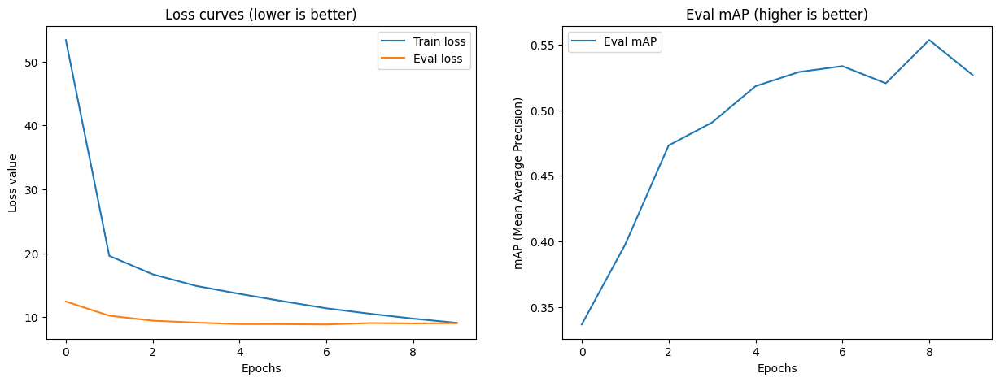

In [ ]:
# 7. Plotting our model's loss cuves
import matplotlib.pyplot as plt

log_history = model_v1_trainer.state.log_history

# Extract loss values
train_loss = [item["loss"] for item in log_history if "loss" in item]
eval_loss = [item["eval_loss"] for item in log_history if "eval_loss" in item]

# Extract map values
eval_map = [item["eval_map"] for item in log_history if "eval_map" in item]

# Plot loss curves and mAP
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
ax[0].plot(train_loss, label = "Train loss")
ax[0].plot(eval_loss, label = "Eval loss")
ax[0].set_title("Loss curves (lower is better)")
ax[0].set_ylabel("Loss value")
ax[0].set_xlabel("Epochs")
ax[0].legend()

ax[1].plot(eval_map, label = "Eval mAP")
ax[1].set_title("Eval mAP (higher is better)")
ax[1].set_ylabel ("mAP (Mean Average Precision)")
ax[1].set_xlabel("Epochs")
ax[1].legend();

## Making predictions on the test datsset

In [ ]:
# Make predictions
test_dataset_preds = model_v1_trainer.predict(test_dataset=processed_dataset["test"])
test_dataset_preds

PredictionOutput(predictions=[({'loss_vfl': array(0.6578045, dtype=float32), 'loss_bbox': array(0.3943085, dtype=float32), 'loss_giou': array(0.26344207, dtype=float32), 'loss_vfl_aux_0': array(0.6722282, dtype=float32), 'loss_bbox_aux_0': array(0.48289, dtype=float32), 'loss_giou_aux_0': array(0.31652284, dtype=float32), 'loss_vfl_aux_1': array(0.5326356, dtype=float32), 'loss_bbox_aux_1': array(0.47269878, dtype=float32), 'loss_giou_aux_1': array(0.30042988, dtype=float32), 'loss_vfl_aux_2': array(0.5468098, dtype=float32), 'loss_bbox_aux_2': array(0.40081066, dtype=float32), 'loss_giou_aux_2': array(0.26621866, dtype=float32), 'loss_vfl_aux_3': array(0.5170676, dtype=float32), 'loss_bbox_aux_3': array(0.46735388, dtype=float32), 'loss_giou_aux_3': array(0.29817656, dtype=float32), 'loss_vfl_aux_4': array(0.5038675, dtype=float32), 'loss_bbox_aux_4': array(0.46691033, dtype=float32), 'loss_giou_aux_4': array(0.2974918, dtype=float32), 'loss_vfl_aux_5': array(0.82176644, dtype=float32

In [ ]:
# Predictions come in the same batch size as our training setup
test_dataset_prediction_outputs = test_dataset_preds.predictions
test_dataset_label_outputs = test_dataset_preds.label_ids

print(f"[INFO] Found {len(test_dataset_prediction_outputs)} batches of prediction samples and {len(test_dataset_label_outputs)} batches of labels.")

[INFO] Found 28 batches of prediction samples and 28 batches of labels.


We can inspect a batch of predictions by taking the 0th index of `test_dataset_prediction_outputs`, inside this batch are:

* Index `0` - Metrics in the form of a dictionary.
* Index `1` - Logits in the form of a NumPy array.
* Index `2` - Bounding box coordinates in the form of a NumPy array.

In [ ]:
# Get the first batch of test prediction samples
test_batch_metrics = test_dataset_prediction_outputs[0][0] # metrics come at index 0 in the form of a dictionary
test_batch_logits = test_dataset_prediction_outputs[0][1] # logits come at index 1 in a numpy array
test_batch_boxes = test_dataset_prediction_outputs[0][2] # predicted boxes come at index 2 in a numpy array

print(f"[INFO] Metrics keys: {test_batch_metrics.keys()}")
print(f"[INFO] Test predictions single batch logits shape: {test_batch_logits.shape} -> (batch_size, num_predictions, logit_per_class)")
print(f"[INFO] Test predictions single batch boxes shape: {test_batch_boxes.shape} -> (batch_size, num_predictions, box_coordinates)")
print(f"[INFO] Test logits type: {type(test_batch_logits)} | Test boxes type: {type(test_batch_boxes)}")

[INFO] Metrics keys: dict_keys(['loss_vfl', 'loss_bbox', 'loss_giou', 'loss_vfl_aux_0', 'loss_bbox_aux_0', 'loss_giou_aux_0', 'loss_vfl_aux_1', 'loss_bbox_aux_1', 'loss_giou_aux_1', 'loss_vfl_aux_2', 'loss_bbox_aux_2', 'loss_giou_aux_2', 'loss_vfl_aux_3', 'loss_bbox_aux_3', 'loss_giou_aux_3', 'loss_vfl_aux_4', 'loss_bbox_aux_4', 'loss_giou_aux_4', 'loss_vfl_aux_5', 'loss_bbox_aux_5', 'loss_giou_aux_5'])
[INFO] Test predictions single batch logits shape: (8, 300, 7) -> (batch_size, num_predictions, logit_per_class)
[INFO] Test predictions single batch boxes shape: (8, 300, 4) -> (batch_size, num_predictions, box_coordinates)
[INFO] Test logits type: <class 'numpy.ndarray'> | Test boxes type: <class 'numpy.ndarray'>


In [ ]:
# We can stack these together to get the full outputs
test_dataset_pred_logits = []
test_dataset_pred_boxes = []

for test_pred_batch in test_dataset_prediction_outputs:
    test_dataset_pred_logits.append(test_pred_batch[1]) # logits come at index 1
    test_dataset_pred_boxes.append(test_pred_batch[2]) # boxes come at index 2

test_dataset_pred_logits = torch.tensor(np.concatenate(test_dataset_pred_logits))
test_dataset_pred_boxes = torch.tensor(np.concatenate(test_dataset_pred_boxes))

print(f"[INFO] Test predictions logits shape: {test_dataset_pred_logits.shape} -> (num_samples, num_predictions, logit_per_class)")
print(f"[INFO] Test predictions boxes shape: {test_dataset_pred_boxes.shape} -> (num_samples, num_predictions, box_coordinates - CXCYWH normalize format)")

[INFO] Test predictions logits shape: torch.Size([224, 300, 7]) -> (num_samples, num_predictions, logit_per_class)
[INFO] Test predictions boxes shape: torch.Size([224, 300, 4]) -> (num_samples, num_predictions, box_coordinates - CXCYWH normalize format)


### Evaluating our test predictions

Now we can evaluate our predictions with `tormetrics.detection.meap_ap.MeanAveragePrecision`

It needs:
 * `preds (List)` - a list of dictionaries (one per image) with the keys `boxes` (in the default XYXY absolute format), `scores` and `labels`. All values are in `torch.Tensor`
 * `target (List)` - a list of dictionaries (one per image) with the keys `boxes` ( in the default  XYXY absolute format), `labels`. Where all values are in `torch.Tensor`

Let’s start by collecting a list of dictionaries for our `preds`.

In [ ]:
# Create an empty list for preds
test_dataset_prediction_dicts = []

# Set a threshold for prediction probabilites
THRESHOLD = 0.0

# Iterate through predictions logits and prediction boxes
for i in range(len(test_dataset_pred_boxes)):
  pred_logits = test_dataset_pred_logits[i].unsqueeze(0)
  pred_boxes = test_dataset_pred_boxes[i].unsqueeze(0)

  # Get original size of input image (require for post processing)
  original_size = processed_dataset["test"][i]["labels"]["orig_size"].unsqueeze(0)

  # Collect prediction outputs
  pred_outputs = ModelOutput(logits = pred_logits,
                             pred_boxes = pred_boxes)

  # Post preocess
  pred_outputs_post_processed = image_processor.post_process_object_detection(
      outputs = pred_outputs,
      threshold = THRESHOLD,
      target_sizes = original_size
  )

  # Create a dictionary of post processed outputs
  prediction_dict = {"boxes": pred_outputs_post_processed[0]["boxes"],
                     "scores": pred_outputs_post_processed[0]["scores"],
                     "labels": pred_outputs_post_processed[0]["labels"]}

  # Append dictionary to list
  test_dataset_prediction_dicts.append(prediction_dict)

print(f'[INFO] Number of prediction dicts: {len(test_dataset_prediction_dicts)}')
print(f"[INFO] Example prediction dict:")
test_dataset_prediction_dicts[0]

[INFO] Number of prediction dicts: 224
[INFO] Example prediction dict:


{'boxes': tensor([[ 289.9449,  373.7044,  658.0450,  849.7588],
         [ 285.3938,  506.9233,  513.2231,  745.9193],
         [ 223.5518,  653.3322,  462.9961,  946.4142],
         ...,
         [ 775.3808,  646.6157,  946.2548,  877.2675],
         [ 294.5505,  398.6412,  505.4844,  645.0031],
         [ 278.4174,  375.2562,  940.5601, 1193.1050]]),
 'scores': tensor([0.9504, 0.9409, 0.2341, 0.1330, 0.0689, 0.0606, 0.0558, 0.0547, 0.0543,
         0.0500, 0.0399, 0.0390, 0.0380, 0.0378, 0.0368, 0.0343, 0.0328, 0.0328,
         0.0314, 0.0311, 0.0309, 0.0308, 0.0300, 0.0294, 0.0293, 0.0291, 0.0289,
         0.0289, 0.0288, 0.0284, 0.0278, 0.0276, 0.0266, 0.0257, 0.0249, 0.0245,
         0.0242, 0.0240, 0.0232, 0.0227, 0.0226, 0.0224, 0.0221, 0.0220, 0.0217,
         0.0210, 0.0208, 0.0207, 0.0203, 0.0202, 0.0200, 0.0200, 0.0198, 0.0197,
         0.0197, 0.0196, 0.0188, 0.0187, 0.0186, 0.0185, 0.0184, 0.0182, 0.0181,
         0.0180, 0.0175, 0.0174, 0.0172, 0.0172, 0.0170, 0.0170, 0.0

Let’s do the same for our targets.

We’ll iterate through each sample in `processed_dataset["test"]` and create a target dictionary for each sample.

The main difference is that we’ll have to convert the boxes from CXCYWH normalized to XYXY absolute.

In [ ]:
# Create a list for targets
test_dataset_target_dicts = []

# Iterate through test samples
for test_sample in processed_dataset["test"]:

    # Extract truth labels
    sample_labels = test_sample["labels"]

    # Extract class labels and boxes
    truth_class_labels = sample_labels["class_labels"]
    truth_boxes = sample_labels["boxes"]

    # Get original size of image
    original_size = sample_labels["orig_size"] # size of original image in (height, width)

    # Convert boxes from CXCYWH normalized to XYXY absolute
    truth_boxes_xyxy = convert_bbox_cxcywh_to_xyxy_absolute(boxes=truth_boxes,
                                                            image_size_target=original_size)

    # Create target truth dictionary
    target_dict = {"boxes": truth_boxes_xyxy,
                   "labels": truth_class_labels}

    # Append target dictionary to list
    test_dataset_target_dicts.append(target_dict)

print(f"[INFO] Number of target dictionaries: {len(test_dataset_target_dicts)}")
print(f"[INFO] Example target dictionary:")
test_dataset_target_dicts[0]

[INFO] Number of target dictionaries: 224
[INFO] Example target dictionary:


{'boxes': tensor([[  64.9000,  922.0001,  339.0000, 1270.2000],
         [ 287.5000,  516.4000,  517.7000,  744.9000],
         [ 216.7000,  647.9999,  476.5000,  946.2000],
         [ 293.7000,  368.0000,  661.3000,  856.9000]]),
 'labels': tensor([4, 5, 1, 0])}

In [ ]:
# Compare predictions to targets
from torchmetrics.detection.mean_ap import MeanAveragePrecision

# Instantiate MAP metric instance
map_metric = MeanAveragePrecision(iou_type="bbox",
                                  class_metrics=True) # we want metrics for each individual class
map_metric.warn_on_many_detections = False # hide extra detection warnings

# Update our metric with list of pred dicts and list of target dicts
map_metric.update(preds=test_dataset_prediction_dicts,
                  target=test_dataset_target_dicts)

# Calculate the metric
test_metric_outputs = map_metric.compute()

# Extract per class metrics (we'll use these later on)
test_map_per_class = test_metric_outputs.pop("map_per_class")
test_mar_per_class = test_metric_outputs.pop("mar_100_per_class")

# Inspect the metrics
test_metric_outputs

{'map': tensor(0.4594),
 'map_50': tensor(0.5988),
 'map_75': tensor(0.5119),
 'map_small': tensor(0.),
 'map_medium': tensor(0.3203),
 'map_large': tensor(0.4715),
 'mar_1': tensor(0.5114),
 'mar_10': tensor(0.7021),
 'mar_100': tensor(0.7475),
 'mar_small': tensor(0.),
 'mar_medium': tensor(0.4683),
 'mar_large': tensor(0.7761),
 'classes': tensor([0, 1, 2, 3, 4, 5, 6], dtype=torch.int32)}

### Visualizing our test dataset evaluation metrics

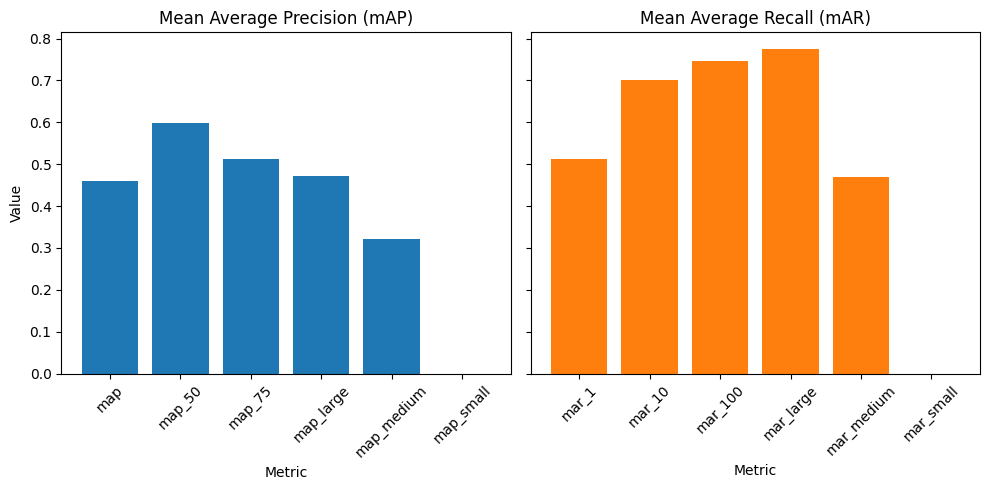

In [ ]:
import matplotlib.pyplot as plt

# Extract mAP and mAR metrics
test_map_metrics = {key: value for key, value in test_metric_outputs.items() if "map" in key}
test_mar_metrics = {key: value for key, value in test_metric_outputs.items() if "mar" in key}

# Get labels and values
test_map_labels, test_map_values = zip(*sorted(test_map_metrics.items()))
test_mar_labels, test_mar_values = zip(*sorted(test_mar_metrics.items()))

# Create a subplot
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 5), sharey=True)

# Add mAP values
ax[0].bar(test_map_labels, test_map_values)
ax[0].set_title("Mean Average Precision (mAP)")
ax[0].set_xlabel("Metric")
ax[0].set_ylabel("Value")
ax[0].tick_params(axis="x", rotation=45)

# Add mAR values
ax[1].bar(test_mar_labels, test_mar_values, color="tab:orange")
ax[1].set_title("Mean Average Recall (mAR)")
ax[1].set_xlabel("Metric")
ax[1].tick_params(axis="x", rotation=45)

plt.tight_layout()

> **Note:**

>Which metric should you optimize for?

>Precision or recall?

>To avoid false positives, optimize for precision (higher predicition probability threshold), this will mean less predictions will be made overall but they will have a higher likelihood of being correct.

>To avoid false negatives, optimize for recall (lower prediction probability threshold), more overall predictions will be made, making it more likely that items will not be missed.

>Which you choose will depend on your problem space.

>If you are in a safety critical space, you might want to optimize for recall (less chance of something being missed but more false positives).

>If user experience matters most, for example, in a consumer app like Trashify, optimize for recall, users often find deleting wrong results preferable to adding missed items.

>If a false positive predicition is costly, optimize for precision.




### Evaluating and visualizing predictions one by one

[INFO] Making predictions on test item with index: 35
[INFO] Total time to perform prediction: 0.053 seconds.
[INFO] Labels with scores:
Pred: trash (0.9469)
Pred: bin (0.9143)
Pred: bin (0.5844)


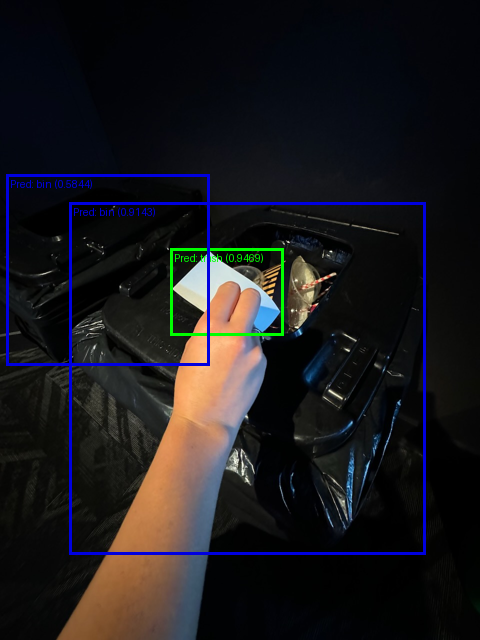

In [ ]:
import time

# Get a random sample from the test preds
random_test_pred_index = random.randint(0, len(processed_dataset["test"]))
print(f"[INFO] Making predictions on test item with index: {random_test_pred_index}")

# Get a random sample from the processed dataset
random_test_sample = processed_dataset["test"][random_test_pred_index]

# Do a single forward pass with the model (we'll time how long it takes for fun)
start_pred_time = time.time()
random_test_sample_outputs = model(pixel_values=random_test_sample["pixel_values"].unsqueeze(0).to("cuda"), # model expects input [batch_size, color_channels, height, width]
                                   pixel_mask=None)
end_pred_time = time.time()
print(f"[INFO] Total time to perform prediction: {round(end_pred_time - start_pred_time, 3)} seconds.")

# Post process a random item from test preds
random_test_sample_outputs_post_processed = image_processor.post_process_object_detection(
    outputs=random_test_sample_outputs,
    threshold=0.35, # prediction probability threshold for boxes (note: boxes from an untrained model will likely be bad)
    target_sizes=random_test_sample["labels"]["orig_size"].unsqueeze(0) # original input image size (or whichever target size you'd like), required to be same number of input items in a list
)

# Extract scores, labels and boxes
random_test_sample_pred_scores = random_test_sample_outputs_post_processed[0]["scores"]
random_test_sample_pred_labels = random_test_sample_outputs_post_processed[0]["labels"]
random_test_sample_pred_boxes = half_boxes(random_test_sample_outputs_post_processed[0]["boxes"])

# Create a list of labels and colours to plot on the boxes
random_test_sample_pred_to_score_tuples = [(id2label[label_pred.item()], round(score_pred.item(), 4))
                                           for label_pred, score_pred in zip(random_test_sample_pred_labels, random_test_sample_pred_scores)]
random_test_sample_labels_to_plot = [f"Pred: {item[0]} ({item[1]})" for item in random_test_sample_pred_to_score_tuples]
random_test_sample_colours_to_plot = [color_palette[item[0]] for item in random_test_sample_pred_to_score_tuples]

print(f"[INFO] Labels with scores:")
for label in random_test_sample_labels_to_plot:
    print(label)

# Plot the predicted boxes on the random test image
test_pred_box_image = to_pil_image(
    pic=draw_bounding_boxes(
        image=pil_to_tensor(pic=half_image(dataset["test"][random_test_pred_index]["image"])),
        boxes=random_test_sample_pred_boxes,
        colors=random_test_sample_colours_to_plot,
        labels=random_test_sample_labels_to_plot,
        width=3
    )
)

test_pred_box_image

### Comparing our model's predicted boxes to the ground thruth boxes

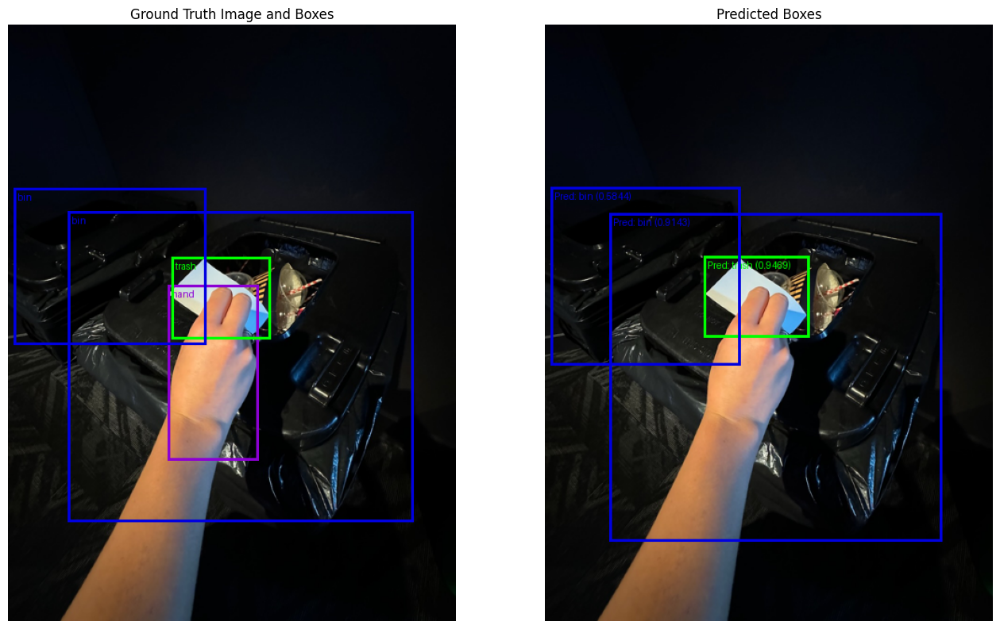

In [ ]:
# Get ground truth image
ground_truth_image = half_image(dataset["test"][random_test_pred_index]["image"])

# Get ground truth boxes (we'll convert these from CXCYWH -> XYXY to be in the same format as our prediction boxes)
ground_truth_boxes = [convert_bbox_cxcywh_to_xyxy_absolute(boxes=input_box,
                                                           image_size_target=random_test_sample["labels"]["orig_size"]) for input_box in random_test_sample["labels"]["boxes"]]
ground_truth_boxes = torch.stack(half_boxes(ground_truth_boxes))

# Get ground truth labels and colours
ground_truth_labels = [id2label[label.item()] for label in random_test_sample["labels"]["class_labels"]]
ground_truth_colours = [color_palette[label] for label in ground_truth_labels]

# Create ground truth box plot image
test_ground_truth_box_image = to_pil_image(
    pic=draw_bounding_boxes(
        image=pil_to_tensor(pic=ground_truth_image),
        boxes=ground_truth_boxes,
        colors=ground_truth_colours,
        labels=ground_truth_labels,
        width=3
    )
)

# Plot ground truth image and boxes to predicted image and boxes
fig, ax = plt.subplots(ncols=2, figsize=(16, 10))
ax[0].imshow(test_ground_truth_box_image)
ax[0].set_title("Ground Truth Image and Boxes")
ax[0].axis(False)
ax[1].imshow(test_pred_box_image)
ax[1].set_title("Predicted Boxes")
ax[1].axis(False)

plt.show()

### Predict on image from the wild

[INFO] Saved to pexels-photo-7565384.jpeg


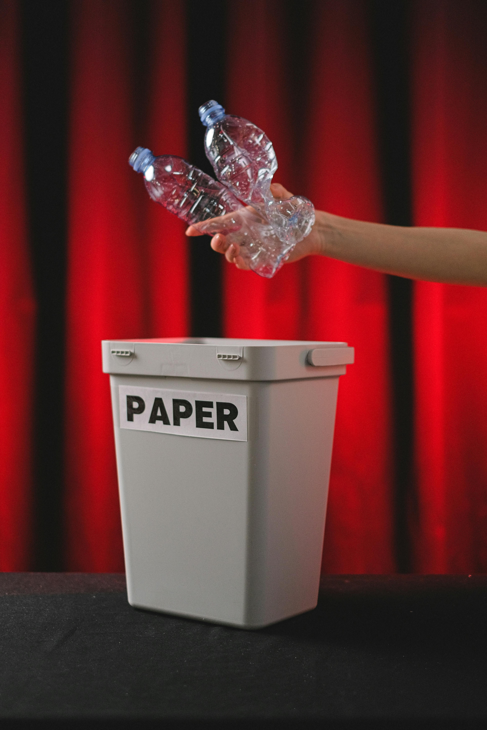

In [ ]:
import requests
from PIL import Image

# Example image of person putting trash in bin
url = "https://images.pexels.com/photos/7565384/pexels-photo-7565384.jpeg"
filename = "pexels-photo-7565384.jpeg"

# Donwload image
with requests.get(url, stream=True, timeout=10) as response:
    response.raise_for_status() # ensure the download succeeded
    with open(filename, "wb") as file:
        for chunk in response.iter_content(chunk_size=8192):
            file.write(chunk)

print(f"[INFO] Saved to {filename}")
image_from_wild = Image.open(filename)
for _ in range(3): # the default image is quite large so we'll half it three times
    image_from_wild = half_image(image_from_wild)
image_from_wild

To make predictions on the downloaded image we’ll go through the following steps:

1. Open the image.
2. Preprocess the image with `image_processor`.
3. Make predictions on the processed image with our `model`.
4. Get the original size of the image for doing box post processing conversions.
5. Set a prediction probability threshold of how confident we’d like our model to be in its predictions.
6. Post process our model’s predictions.
7. Extract the post processed labels, scores and box coordinates.
8. Create a list of labels, scores and colours to plot.
9. Draw our model’s predicted bounding boxes on the target image with `draw_bounding_boxes` and `to_pil_image`.

[INFO] Test image size: tensor([640, 640])
[INFO] Labels with scores:
Pred: bin (0.9465)
Pred: trash (0.9241)


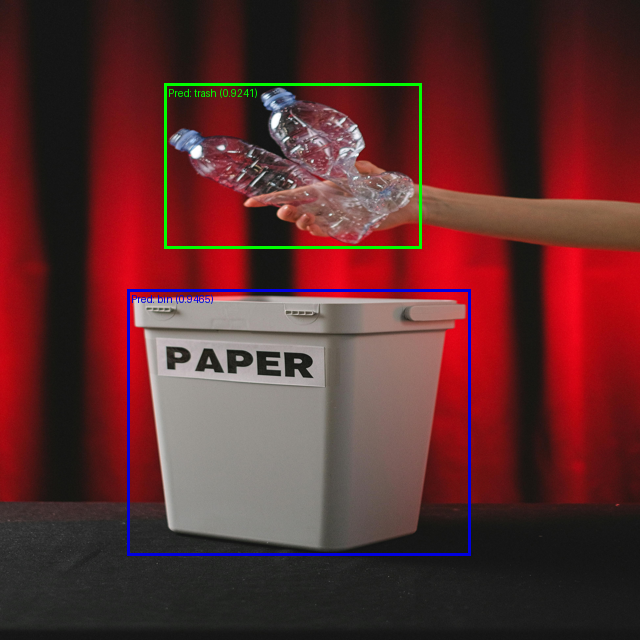

In [ ]:
# Pred on image from pathname
from pathlib import Path
from PIL import Image

def get_image_dimensions_from_pil(image: Image.Image) -> torch.tensor:
    """
    Convert the dimensions of a PIL image to a PyTorch tensor in the order (height, width).

    Args:
        image (Image.Image): The input PIL image.

    Returns:
        torch.Tensor: A tensor containing the height and width of the image.
    """
    # Get (width, height) of image (PIL.Image.size returns width, height)
    width, height = image.size

    # Convert to a tensor in the order (height, width)
    image_dimensions_tensor = torch.tensor([height, width])

    return image_dimensions_tensor

# Get a test image
test_image_pil = Image.open("pexels-photo-7565384.jpeg").resize(size=(640, 640))

# Preprocess the image
test_image_preprocessed = image_processor.preprocess(images=test_image_pil,
                                                     return_tensors="pt")

# Make predictions on the preprocessed image
random_test_sample_outputs = model(pixel_values=test_image_preprocessed["pixel_values"].to("cuda"), # model expects input [batch_size, color_channels, height, width]
                                   pixel_mask=None)

# Get image original size
test_image_size = get_image_dimensions_from_pil(image=test_image_pil)
print(f"[INFO] Test image size: {test_image_size}")

# Create the threshold, we can adjust this based on how confident we'd like our model to be about its predictions
THRESHOLD = 0.4

# Post process the predictions
random_test_sample_outputs_post_processed = image_processor.post_process_object_detection(
    outputs=random_test_sample_outputs,
    threshold=THRESHOLD,
    target_sizes=test_image_size.unsqueeze(0) # needs to be same length as batch dimension of the logits (e.g. [[height, width]])
)

# Extract scores, labels and boxes
random_test_sample_pred_scores = random_test_sample_outputs_post_processed[0]["scores"]
random_test_sample_pred_labels = random_test_sample_outputs_post_processed[0]["labels"]
random_test_sample_pred_boxes = random_test_sample_outputs_post_processed[0]["boxes"]

# Create a list of labels to plot on the boxes
random_test_sample_labels_to_plot = [f"Pred: {id2label[label_pred.item()]} ({round(score_pred.item(), 4)})"
                                     for label_pred, score_pred in zip(random_test_sample_pred_labels, random_test_sample_pred_scores)]
random_test_sample_colours_to_plot = [color_palette[id2label[label_pred.item()]] for label_pred in random_test_sample_pred_labels]

print("[INFO] Labels with scores:")
for item in random_test_sample_labels_to_plot:
    print(item)

# Plot the predicted boxes on the random test image
to_pil_image(
    pic=draw_bounding_boxes(
        image=pil_to_tensor(pic=test_image_pil),
        colors=random_test_sample_colours_to_plot,
        boxes=random_test_sample_pred_boxes,
        labels=random_test_sample_labels_to_plot,
        width=3
    )
)